In [1]:
import pandas as pd
from Main import settings, features, pf_set
import time
import pickle
import matplotlib.pyplot as plt
from pandas.tseries.offsets import DateOffset
import Prepare_Data
import data_run_files
import return_prediction_functions
from return_prediction_functions import rff
import numpy as np
from pandas.tseries.offsets import MonthEnd
from sklearn.linear_model import Ridge
import General_Functions
import pickle
import Estimate_Covariance_Matrix
import os
import prepare_portfolio_data
import portfolio_choice_functions
import scipy.linalg
import functools
import importlib
import cvxpy as cp
import seaborn as sns
sqrtm_cpp = importlib.import_module("sqrtm_cpp")
start_date = pd.to_datetime('1952-12-31')

#Relevante paths
output_path = "./data_fifty/"
pickle_file_path = "./data_fifty/model_1.pkl"
wealth_path = "./data_fifty/wealth.csv"
barra_file_path = "./data_fifty/barra_cov.pkl"
output_path_market_returns = "data_fifty/market_returns_test.csv"

risk_free_path = "./data_fifty/risk_free_test.csv" 
output_data_ret_csv = "./data_fifty/data_ret.csv"  
output_data_ret_ld1_csv = "./data_fifty/data_ret_ld1.csv"

file_path_cluster_labels = "Data/Cluster Labels.csv"
file_path_factor_details = "Data/Factor Details.xlsx"

risk_free = data_run_files.process_risk_free_rate(risk_free_path, start_date)
daily_path = "./data_fifty/daily.csv"
chars_path = "./data_fifty/chars_behandlet.parquet"


Features list length: 154
Filtrering udført. Antal rækker efter filtrering: 841
Fil gemt som ./data_test/risk_free_test.csv


In [2]:
#Folder hvor resultater og plots gemmes (hvis du kører Hede så ændrer denne for din :D)
output_folder = r"C:\Users\jonas\OneDrive\CBS\Kandidat - CBS\Speciale\Resultater Python"

## Data indlæsning

In [3]:
wealth = pd.read_csv(wealth_path)
wealth['eom'] = pd.to_datetime(wealth['eom'])
data_ret = pd.read_csv(output_data_ret_csv)
data_ret_ld1 = pd.read_csv(output_data_ret_ld1_csv)
data_ret['eom'] = pd.to_datetime(data_ret['eom'])
data_ret_ld1['eom'] = pd.to_datetime(data_ret_ld1['eom'])
data_ret_ld1['eom_ret'] = pd.to_datetime(data_ret_ld1['eom_ret'])
daily = pd.read_csv(daily_path, parse_dates=["date", "eom"])
chars = pd.read_parquet(chars_path)

In [4]:
with open(barra_file_path, "rb") as file:
    barra_cov = pickle.load(file)

In [5]:
print(barra_cov['2022-11-30']['ivol_vec'])

id
10104    0.004043
10107    0.002393
10138    0.002996
10696    0.003696
11308    0.001280
           ...   
87299    0.004106
87432    0.003534
87447    0.003139
87717    0.003166
92655    0.002555
Name: res_vol, Length: 180, dtype: float64


In [6]:
chars = prepare_portfolio_data.add_return_predictions(chars,settings, output_path)
lambda_list = prepare_portfolio_data.create_lambda_list(chars)
first_cov_date, hp_years, start_oos = prepare_portfolio_data.define_important_dates(barra_cov, settings)
date_ranges = prepare_portfolio_data.create_date_ranges(settings, first_cov_date, start_oos, hp_years)
dates_m1 = date_ranges["dates_m1"]
dates_m2 = date_ranges["dates_m2"]
dates_oos = date_ranges["dates_oos"]
dates_hp = date_ranges["dates_hp"]
#Disse er alle korrekte

#### Check af barra cov

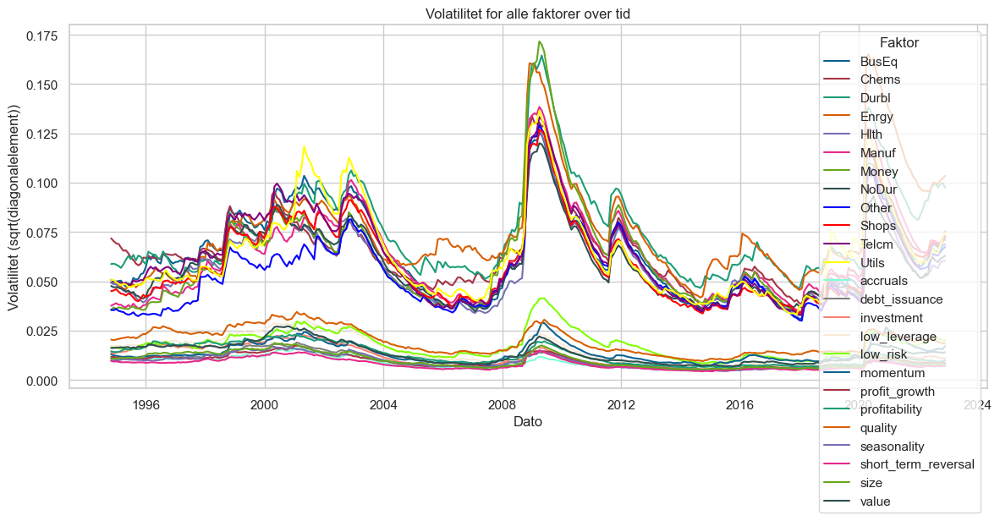

In [7]:
# Sorter datoerne
dates = sorted(barra_cov.keys())

# Hent faktornavne fra fct_cov for den første dato
first_date = dates[0]
factor_names = barra_cov[first_date]['fct_cov'].columns.tolist()

# Saml data: for hver dato og for hver faktor udregnes volatiliteten (sqrt af diagonalelementet)
records = []
for date in dates:
    df = barra_cov[date]['fct_cov']
    for factor in factor_names:
        vol = np.sqrt(df.loc[factor, factor])
        records.append({'date': pd.to_datetime(date), 'factor': factor, 'vol': vol})

# Konverter listen til en DataFrame
vol_data = pd.DataFrame(records)

# Plot: lav en linje for hver faktor over tid
plt.figure(figsize=(12, 6))
for factor in factor_names:
    subset = vol_data[vol_data['factor'] == factor]
    plt.plot(subset['date'], subset['vol'], label=factor)

plt.title("Volatilitet for alle faktorer over tid")
plt.xlabel("Dato")
plt.ylabel("Volatilitet (sqrt(diagonalelement))")
plt.legend(title="Faktor")
plt.tight_layout()
plt.show()


## Portfolio metrics funktioner

In [8]:
def calculate_portfolio_metrics(tpf):
    """
    Udregner porteføljens nøgletal ud fra tpf['pf']-DataFrame.
    
    Returnerer en ordbog med nøgletal:
      - r_yearly: Årligt gennemsnitligt afkast
      - std_yearly: Årlig standardafvigelse
      - SR_gross_yearly: Årlig Sharpe ratio (brutto)
      - tc_yearly: Årlige transaktionsomkostninger
      - r_tc_yearly: Årligt afkast efter transaktionsomkostninger
      - SR_net_yearly: Årlig Sharpe ratio (netto)
      - inv: Gennemsnitlig investering
      - Shorting: Gennemsnitligt shorting
      - Turnover: Gennemsnitligt turnover
    """
    pf = tpf['pf']
    r_yearly = np.mean(pf['r']) * 12
    std_yearly = pf['r'].std() * np.sqrt(12)
    SR_gross_yearly = (np.mean(pf['r']) / pf['r'].std()) * np.sqrt(12)
    tc_yearly = np.mean(pf['tc']) * 12
    r_tc_yearly = np.mean(pf['r'] - pf['tc']) * 12
    SR_net_yearly = (np.mean(pf['r'] - pf['tc']) / pf['r'].std()) * np.sqrt(12)
    inv_mean = np.mean(pf['inv'])
    shorting_mean = np.mean(pf['shorting'])
    turnover_mean = np.mean(pf['turnover'])
    
    return {
        "r_yearly": r_yearly,
        "std_yearly": std_yearly,
        "SR_gross_yearly": SR_gross_yearly,
        "tc_yearly": tc_yearly,
        "r_tc_yearly": r_tc_yearly,
        "SR_net_yearly": SR_net_yearly,
        "inv": inv_mean,
        "Shorting": shorting_mean,
        "Turnover": turnover_mean
    }

def compare_portfolio_metrics(tpf_original, tpf_new):
    """
    Sammenligner nøgletal for to porteføljer (tpf_original og tpf_new)
    og returnerer en DataFrame med kolonnerne "Metric", "Original" og "New".
    """
    metrics_orig = calculate_portfolio_metrics(tpf_original)
    metrics_new = calculate_portfolio_metrics(tpf_new)
    
    df_results = pd.DataFrame({
        "Metric": list(metrics_orig.keys()),
        "Markowitz-ML": list(metrics_orig.values()),
        "Markowitz-ML TC optimeret": list(metrics_new.values())
    })
    
    return df_results


In [23]:
def plot_specific_ids(df, id_list=None, weight_col='w', ax=None, show_legend=True):
    """
    Plotter 'weight_col' for de ID'er, der findes i id_list.
    Hvis id_list er None, plottes alle ID'er.
    Kan også plotte direkte på given matplotlib-akse (ax).
    """
    if id_list is None:
        id_list = df['id'].unique().tolist()
    
    # Filtrér til de ønskede id'er
    df_sub = df[df['id'].isin(id_list)].copy()
    df_sub = df_sub.sort_values('eom')
    
    # Pivotér så index = eom, columns = id, values = weight_col
    pivot_df = df_sub.pivot(index='eom', columns='id', values=weight_col)

    # Plot
    if ax is not None:
        pivot_df.plot(ax=ax, legend=show_legend)
        ax.set_title(f"Udvikling i {weight_col} for ID'er")
        ax.set_xlabel("Dato")
        ax.set_ylabel(weight_col)
        if show_legend:
            ax.legend(title="ID", fontsize=9)
    else:
        pivot_df.plot(figsize=(10, 6), legend=show_legend)
        plt.title(f"Udvikling i {weight_col} for ID'er")
        plt.xlabel("Dato")
        plt.ylabel(weight_col)
        if show_legend:
            plt.legend(title="ID", fontsize=9)
        plt.show()


# Markowitz optimeringen (OG version uden trade cost opt) - resultater og plots

In [9]:
tpf_original = portfolio_choice_functions.tpf_implement(data=chars, cov_list=barra_cov, wealth=wealth, dates=dates_oos, gam=pf_set["gamma_rel"])

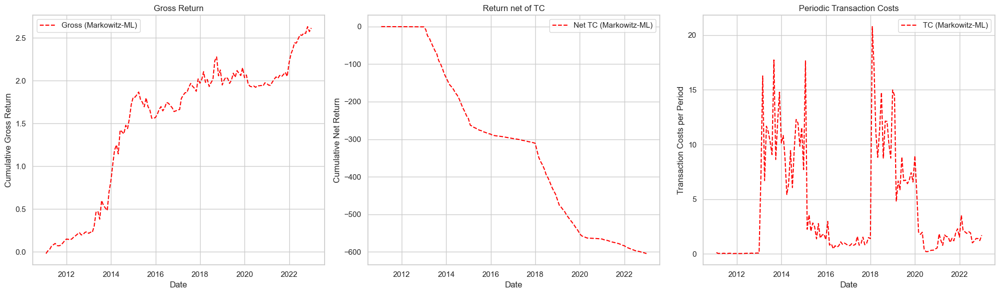

In [10]:
# Kopier dataframe for Markowitz-ML
tpf_data = tpf_original["pf"].copy()

# Beregn kumulative afkast for Markowitz-ML
tpf_data['cumret'] = tpf_data['r'].cumsum()
tpf_data['cumret_tc'] = (tpf_data['r'] - tpf_data['tc']).cumsum()

# Opret 3 subplots: Gross Return, Return net of TC og Periodiske Transaction Costs
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# --- Plot 1: Gross Return ---
ax = axes[0]
ax.plot(tpf_data['eom_ret'], tpf_data['cumret'], label='Gross (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Gross Return')
ax.set_title('Gross Return')
ax.grid(True)
ax.legend()

# --- Plot 2: Return net of TC ---
ax = axes[1]
ax.plot(tpf_data['eom_ret'], tpf_data['cumret_tc'], label='Net TC (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Net Return')
ax.set_title('Return net of TC')
ax.grid(True)
ax.legend()

# --- Plot 3: Periodiske Transaction Costs ---
ax = axes[2]
ax.plot(tpf_data['eom_ret'], tpf_data['tc'], label='TC (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Transaction Costs per Period')
ax.set_title('Periodic Transaction Costs')
ax.grid(True)
ax.legend()

plt.tight_layout()
plt.show()


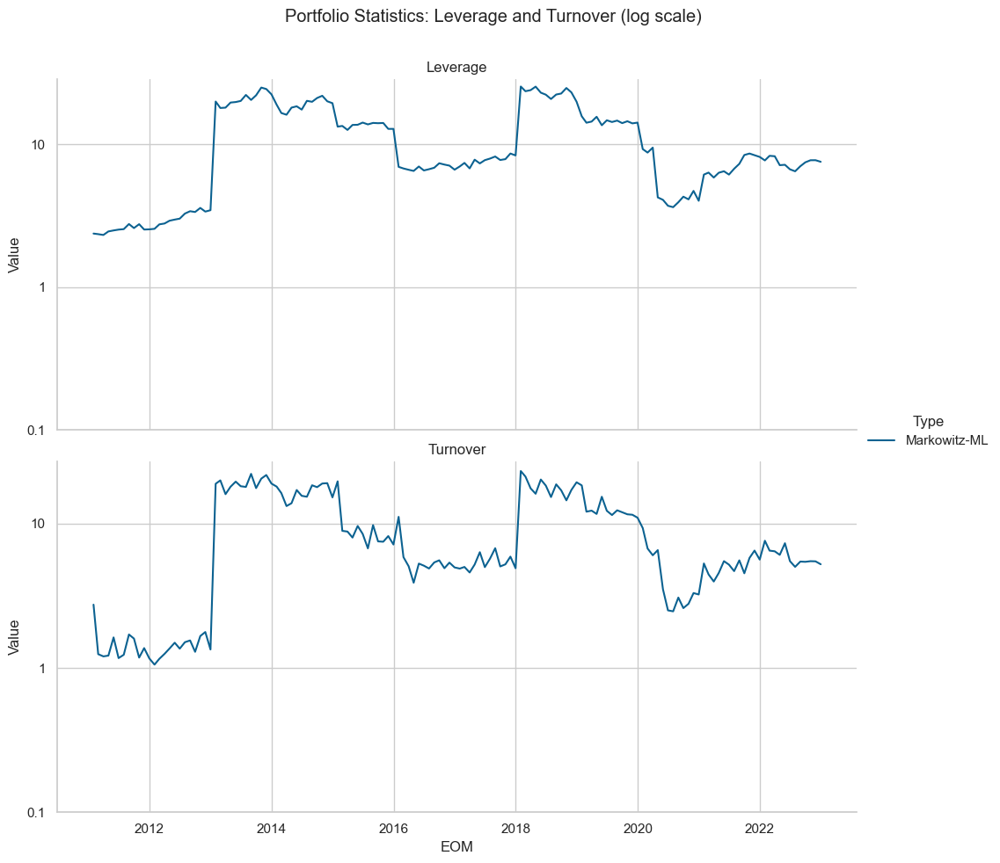

In [11]:
# 1. Kopier data for Markowitz-ML
tpf_pf = tpf_original['pf'].copy()

# 2. Sæt type-kolonnen til "Markowitz-ML"
tpf_pf["type"] = "Markowitz-ML"

# 3. Vælg de relevante kolonner: eom_ret, inv og turnover (samt type)
ws = tpf_pf[['eom_ret', 'inv', 'turnover', 'type']].copy()

# 4. Omdøb eom_ret til eom for korthed
ws.rename(columns={'eom_ret': 'eom'}, inplace=True)

# 5. Konverter til long format, så vi kan plotte Leverage og Turnover i separate paneler
ws_long = ws.melt(
    id_vars=['type', 'eom'],
    value_vars=['inv', 'turnover'],
    var_name='metric',
    value_name='value'
)

# 6. Omdøb metric-værdier til pænere navne
ws_long['metric'] = ws_long['metric'].map({
    'inv': 'Leverage',
    'turnover': 'Turnover'
})

# 7. Plot med Seaborn's FacetGrid
g = sns.FacetGrid(ws_long, col="metric", col_wrap=1, sharey=False, height=5, aspect=2)
g.map_dataframe(sns.lineplot, x="eom", y="value", hue="type", style="type")

# Sæt y-aksen til log-skala
g.set(yscale="log")

# Fjern "metric = " i facettitlen
g.set_titles("{col_name}")

# Tilføj en fælles legend
g.add_legend(title="Type")

# Angiv egne ticks på y-aksen
for ax in g.axes.flatten():
    ax.set_yticks([0.1, 1, 10])
    ax.set_yticklabels(['0.1', '1', '10'])

# Sæt akse-labels og en overordnet titel
g.set_axis_labels("EOM", "Value")
plt.subplots_adjust(top=0.9)
g.fig.suptitle("Portfolio Statistics: Leverage and Turnover (log scale)")

plt.show()


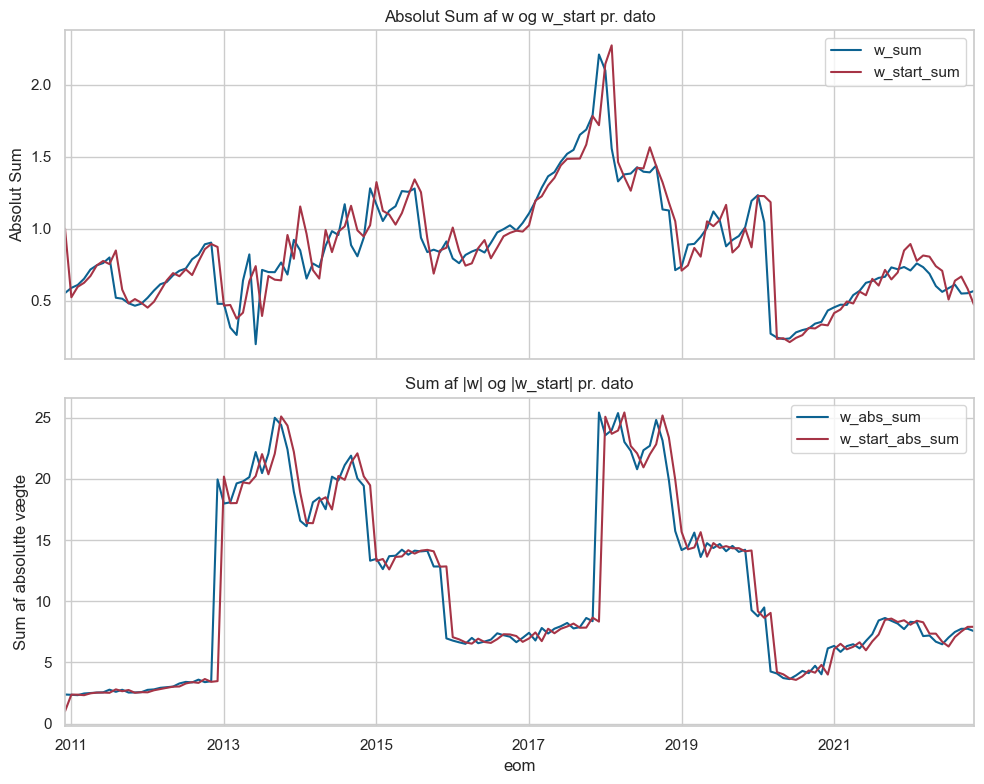

In [12]:
df = tpf_original["w"].copy()

# 1) Gruppér pr. dato (eom) og beregn sum af w, sum af w_start,
#    samt sum af |w| og sum af |w_start|
df_agg = df.groupby("eom").agg({
    "w": ["sum", lambda x: x.abs().sum()],
    "w_start": ["sum", lambda x: x.abs().sum()]
})

# 2) Giv kolonnerne mere sigende navne
df_agg.columns = ["w_sum", "w_abs_sum", "w_start_sum", "w_start_abs_sum"]

# 3) Plot
fig, ax = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

# Plot sum(w) og sum(w_start) i øverste subplot
df_agg[["w_sum", "w_start_sum"]].plot(ax=ax[0])
ax[0].set_title("Absolut Sum af w og w_start pr. dato")
ax[0].set_ylabel("Absolut Sum")

# Plot sum(|w|) og sum(|w_start|) i nederste subplot
df_agg[["w_abs_sum", "w_start_abs_sum"]].plot(ax=ax[1])
ax[1].set_title("Sum af |w| og |w_start| pr. dato")
ax[1].set_ylabel("Sum af absolutte vægte")

plt.tight_layout()
plt.show()


# Markowitz-ML med transactions cost optimering

Ny optimering med både minimering af transaktionsomkostninger samt begrænsning på de optimale vægte

In [14]:
def w_fun_qpstyle(tpf_opt, data, wealth, dates):
    """
    Genskaber logikken fra w_fun, men bruger QP-vægtene i tpf_opt.
    For hver dato t bliver w_start(t) = w_final(t-1) * (1 + tr_ld1(t-1)) / (1 + mu_ld1(t-1)).
    """
    # 1) Sikr at (id, eom) er unikke i tpf_opt
    tpf_opt = tpf_opt.drop_duplicates(subset=['id','eom'])

    # 2) For at få tr_ld1 og mu_ld1 for "forrige" dato, 
    #    laver vi merges med data og wealth, men rename eom -> eom_prev
    data_prev = data[['id','eom','tr_ld1']].drop_duplicates(subset=['id','eom'])
    data_prev = data_prev.rename(columns={'eom':'eom_prev','tr_ld1':'tr_ld1_prev'})
    
    wealth_prev = wealth[['eom','mu_ld1']].drop_duplicates(subset=['eom'])
    wealth_prev = wealth_prev.rename(columns={'eom':'eom_prev','mu_ld1':'mu_ld1_prev'})
    
    # 3) Omdøb w til w_prev og eom til eom_prev => "forrige" periodes w
    w_prev = tpf_opt.rename(columns={'w':'w_prev','eom':'eom_prev'})
    w_prev = w_prev.drop_duplicates(subset=['id','eom_prev'])

    # 4) Merge w_prev med data_prev og wealth_prev
    w_prev = pd.merge(w_prev, data_prev, on=['id','eom_prev'], how='left')
    w_prev = pd.merge(w_prev, wealth_prev, on='eom_prev', how='left')
    # Nu har w_prev kolonner: [id, eom_prev, w_prev, tr_ld1_prev, mu_ld1_prev]

    # 5) Lav en DataFrame med (eom, eom_prev) for at matche "nuværende" eom med forrige eom
    dates_df = pd.DataFrame({'eom': dates})
    dates_df['eom_prev'] = dates_df['eom'].shift(1)

    # 6) Merge tpf_opt (den "nuværende" w) med dates_df for at få eom_prev
    w_df = pd.merge(tpf_opt, dates_df, on='eom', how='left')
    # w_df har [id, eom, w, eom_prev]

    # 7) Merge w_df med w_prev (dvs. forrige måneds w + tr_ld1_prev, mu_ld1_prev)
    w_df = pd.merge(w_df, w_prev, on=['id','eom_prev'], how='left')
    # w_df har nu: [id, eom, w, eom_prev, w_prev, tr_ld1_prev, mu_ld1_prev]

    # 8) Beregn w_start for den nuværende dato:
    #    w_start(t) = w_prev(t-1) * (1 + tr_ld1_prev)/(1 + mu_ld1_prev)
    #    Hvis eom_prev er NaN (første dato), sæt w_start = np.nan eller initiel vægt
    w_df['w_start'] = w_df['w_prev'] * (1 + w_df['tr_ld1_prev']) / (1 + w_df['mu_ld1_prev'])
    #w_df['w_start'] = w_df['w_prev'] * (1 + w_df['tr_ld1']) / (1 + w_df['mu_ld1'])

    
    # For første dato i 'dates', eom_prev er NaN => w_start bliver NaN
    # Du kan fx erstatte med initiale vægte (VW) for den første dato:
    first_date = dates[0]
    init_w = General_Functions.initial_weights_new(data[data['eom'] == first_date], w_type="vw")[['id','w_start']]
    # Merge for at få init_w
    w_df = pd.merge(w_df, init_w, on='id', how='left', suffixes=('', '_init'))
    # Hvor eom == first_date, brug w_start_init
    w_df.loc[w_df['eom'] == first_date, 'w_start'] = w_df.loc[w_df['eom'] == first_date, 'w_start_init']
    missing = w_df['w_start'].isna()
    w_df.loc[missing, 'w_start'] = 0
    #w_df.loc[missing, ['tr_ld1_prev','mu_ld1_prev']] = np.nan
    #w_df['w_start'] = w_df['w_start'].fillna(0)

    # 9) Merge nu tr_ld1 og mu_ld1 for *den nuværende* dato (ikke prev) - hvis du ønsker dem i output
    # 9) Merge tr_ld1 og mu_ld1 for den forrige periode
    data_subset_shifted = data[['id','eom','tr_ld1']].drop_duplicates(subset=['id','eom'])
    data_subset_shifted = data_subset_shifted.rename(columns={'eom': 'eom_prev'})
    wealth_subset_shifted = wealth[['eom','mu_ld1']].drop_duplicates(subset=['eom'])
    wealth_subset_shifted = wealth_subset_shifted.rename(columns={'eom': 'eom_prev'})
    w_df = pd.merge(w_df, data_subset_shifted, on=['id','eom_prev'], how='left')
    w_df = pd.merge(w_df, wealth_subset_shifted, on='eom_prev', how='left')
    w_df.loc[missing, ['tr_ld1','mu_ld1']] = np.nan


    #Ændret!!!
    #w_df.loc[w_df['eom'] == first_date, ['tr_ld1', 'mu_ld1']] = np.nan

    # 10) Ryd op i kolonnerne, så vi får det endelige format
    w_df = w_df[['id','eom','w_start','w','tr_ld1','mu_ld1']]

    return w_df


In [134]:
def tpf_implement_qp(data, cov_list, wealth, dates, gam, delta, alpha):
    """
    Beregner porteføljevægte dato-for-dato med:
      - Klassisk Markowitz-ML til at finde w_opt,
      - En QP, der sikrer at w_final ligger inden for ±delta af w_opt,
      - Og som minimerer en kombineret objektfunktion:
            alpha * ||w - w_opt||^2  +  (1 - alpha) * sum(lam * (w - w_start)^2)
        hvor w_start er den afkastjusterede vægt fra forrige periode.
        
    Parametre:
      - data: DataFrame med aktiedata
      - cov_list: dictionary med kovariansmatricer (nøgle: dato)
      - wealth: DataFrame med wealth og mu_ld1 (for hver dato)
      - dates: liste over datoer
      - gam: risikoaversion parameter
      - delta: maks. afvigelse fra w_opt (f.eks. 0.2)
      - alpha: vægtning mellem at holde sig tæt på w_opt og minimere transaktionsomkostninger
      
    Returnerer:
      - tpf_opt: DataFrame med kolonnerne ['id', 'eom', 'w'] for hver dato.
    """
    # Filtrer og sorter data
    data_rel = data[(data['valid'] == True) & (data['eom'].isin(dates))][['id', 'eom', 'me', 'tr_ld1', 'pred_ld1']]
    data_rel = data_rel.sort_values(by=['id', 'eom'])
    data_split = {d: df for d, df in data_rel.groupby('eom')}

    # Helper-funktion til afkastjustering af w_prev
    def adjust_w_prev_for_returns(w_prev_series, df_current, wealth_current):
        df_current = df_current.set_index('id')
        w_prev_aligned = w_prev_series.reindex(df_current.index).fillna(0)
        tr_ld1 = df_current['tr_ld1']
        mu_ld1 = wealth_current['mu_ld1'].iloc[0]  # antager én værdi pr. dato
        return w_prev_aligned * (1 + tr_ld1) / (1 + mu_ld1)

    tpf_opt_list = []
    
    # For den første dato: brug initiale VW-vægte
    first_date = dates[0]
    data_first = data_split[first_date]
    init_w = General_Functions.initial_weights_new(data_first, w_type="vw")
    # Sørg for at gemme som Series med id som index
    w_prev_final = pd.Series(init_w['w_start'].values, index=init_w['id'])

    for d in dates:
        # Lav nøglen til cov_list
        d_key = d.strftime('%Y-%m-%d') if isinstance(d, pd.Timestamp) else d
        data_sub = data_split.get(d)
        if data_sub is None or data_sub.empty:
            continue

        ids = data_sub['id'].tolist()
        sigma = General_Functions.create_cov(cov_list[d_key], ids=ids)
        pred_vector = data_sub['pred_ld1'].values

        # 1) Beregn klassisk w_opt
        w_opt = (1 / gam) * np.linalg.solve(sigma, pred_vector)

        # 2) Juster w_prev_final for afkast
        wealth_d = wealth.loc[wealth['eom'] == d]
        w_start = adjust_w_prev_for_returns(w_prev_final, data_sub, wealth_d)

        # 3) Lav QP med kombineret objektfunktion:
        #    alpha * ||w - w_opt||^2  +  (1 - alpha)* sum(lam*(w - w_start)^2)
        lam = data_sub['lambda'].values if 'lambda' in data_sub.columns else np.ones_like(w_opt)
        n = len(w_opt)
        w = cp.Variable(n)
        obj = alpha * cp.sum_squares(w - w_opt) \
              + (1 - alpha) * cp.sum(cp.multiply(lam, cp.square(w - w_start)))
        constraints = [
            w >= w_opt - delta,
            w <= w_opt + delta,
            cp.sum(w) == 1
            # evt. tilføj w >= 0 hvis long-only ønskes
        ]
        prob = cp.Problem(cp.Minimize(obj), constraints)
        prob.solve(solver=cp.OSQP)

        if w.value is None:
            raise ValueError(f"Optimeringsproblemet for dato {d} kunne ikke løses.")
        w_final = w.value

        # 4) Gem resultater for denne dato
        temp_df = data_sub[['id', 'eom']].copy()
        temp_df['w'] = w_final
        tpf_opt_list.append(temp_df)

        # 5) Opdater w_prev_final til næste iteration som en Series med index = id
        w_prev_final = pd.Series(w_final, index=data_sub['id'])

    # Saml resultaterne
    if tpf_opt_list:
        tpf_opt = pd.concat(tpf_opt_list, ignore_index=True)
    else:
        tpf_opt = pd.DataFrame(columns=['id','eom','w'])

    # Du kan eventuelt køre en efterfølgende funktion (w_fun_post) for yderligere behandling.
    tpf_w = w_fun_post(tpf_opt, data, wealth)
    return tpf_opt  # eller returnér en dict med både "w" og "pf"

def w_fun_post(tpf_opt, data, wealth):
    """
    Enkel version af w_fun - returnerer blot tpf_opt.
    """
    return tpf_opt


In [135]:
def run_markowitz_qp_pipeline(data, cov_list, wealth, dates, gam, delta, alpha):
    # 1) Kør QP for at få endelige vægte (med kombineret objektfunktion)
    tpf_opt = tpf_implement_qp(data, cov_list, wealth, dates, gam, delta=delta, alpha=alpha)
    
    # 2) Skab w-df med w_start, tr_ld1, mu_ld1 osv.
    tpf_w = w_fun_qpstyle(tpf_opt, data, wealth, dates)
    
    # 3) Beregn porteføljestatistikker
    tpf_pf = General_Functions.pf_ts_fun(tpf_w, data, wealth, gam)
    
    return {
        "w": tpf_w,
        "pf": tpf_pf
    }

# Eksempel på kald:
tpf_trans = run_markowitz_qp_pipeline(
    data=chars, 
    cov_list=barra_cov, 
    wealth=wealth, 
    dates=dates_oos, 
    gam=pf_set["gamma_rel"],
    delta=0.3,   # Sørger for, at vi ikke afviger med mere end ± delta fra w_opt
    alpha=0    # Juster alpha alt efter, hvor meget der forankres i w_opt vs. minimere TC
    #Hvis alpha = 1, så bliver løsningen så tæt den optimale portefølje uanset trade cost
    #Hvis alpha = 0, så fokuseres der udelukkende på at minimere transaktionsomkostninger
    #delta angiver hvor meget man må afvige fra de optimale vægte
    #Generelt skal vi bare holde alpha lig 0
)


# Relevante plots og stats for Original MVO vs trade cost optimeret MVO

In [179]:
df_metrics = compare_portfolio_metrics(tpf_original, tpf_trans)
display(df_metrics)
latex_table = df_metrics.to_latex(index=False, float_format="%.4f", caption="Sammenligning af porteføljemålepunkter", label="tab:portfolio_metrics")
print(latex_table)
latex_table = df_metrics.set_index("Metric").T.to_latex(
    float_format="%.4f",
    caption="Sammenligning af porteføljemålepunkter (transponeret)",
    label="tab:portfolio_metrics_transposed"
)
print(latex_table)

,Metric,Markowitz-ML,Markowitz-ML TC optimeret
0,r_yearly,0.21786820,0.25698850
1,std_yearly,0.25123497,0.20493829
2,SR_gross_yearly,0.86718900,1.25397991
3,tc_yearly,50.58341234,1.17665879
4,r_tc_yearly,-50.36554413,-0.91967029
5,SR_net_yearly,-200.47186979,-4.48754735
6,inv,10.95336768,7.57588147
7,Shorting,5.04830081,3.28794074
8,Turnover,8.77686726,0.65246445


\begin{table}
\caption{Sammenligning af porteføljemålepunkter}
\label{tab:portfolio_metrics}
\begin{tabular}{lrr}
\toprule
Metric & Markowitz-ML & Markowitz-ML TC optimeret \\
\midrule
r_yearly & 0.2179 & 0.2570 \\
std_yearly & 0.2512 & 0.2049 \\
SR_gross_yearly & 0.8672 & 1.2540 \\
tc_yearly & 50.5834 & 1.1767 \\
r_tc_yearly & -50.3655 & -0.9197 \\
SR_net_yearly & -200.4719 & -4.4875 \\
inv & 10.9534 & 7.5759 \\
Shorting & 5.0483 & 3.2879 \\
Turnover & 8.7769 & 0.6525 \\
\bottomrule
\end{tabular}
\end{table}

\begin{table}
\caption{Sammenligning af porteføljemålepunkter (transponeret)}
\label{tab:portfolio_metrics_transposed}
\begin{tabular}{lrrrrrrrrr}
\toprule
Metric & r_yearly & std_yearly & SR_gross_yearly & tc_yearly & r_tc_yearly & SR_net_yearly & inv & Shorting & Turnover \\
\midrule
Markowitz-ML & 0.2179 & 0.2512 & 0.8672 & 50.5834 & -50.3655 & -200.4719 & 10.9534 & 5.0483 & 8.7769 \\
Markowitz-ML TC optimeret & 0.2570 & 0.2049 & 1.2540 & 1.1767 & -0.9197 & -4.4875 & 7.5759 & 

### Plot af gross return, net-return og periodisk tc (Markowitz-ML og Markowitz-ML trade cost optimized)

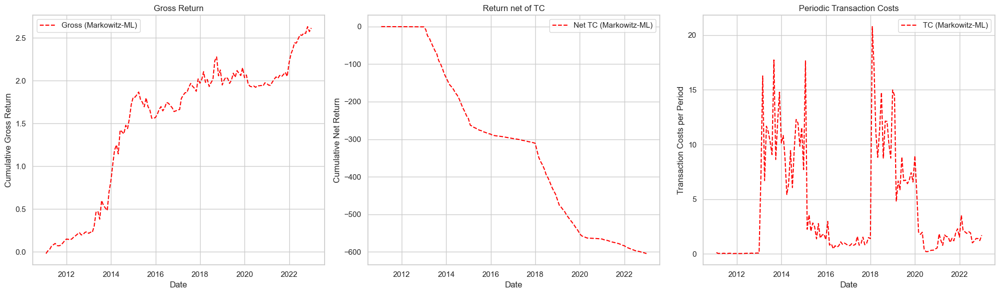

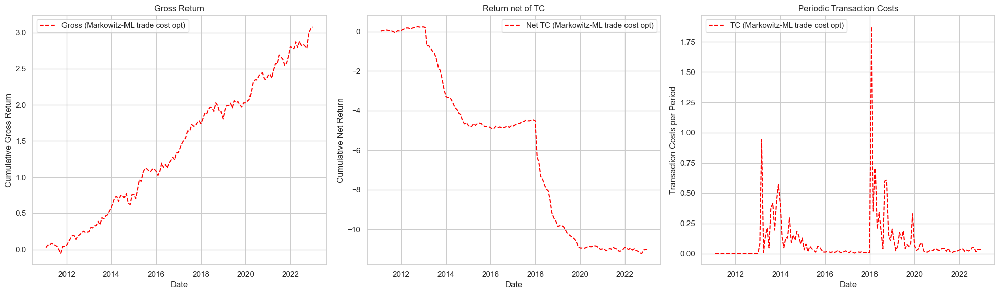

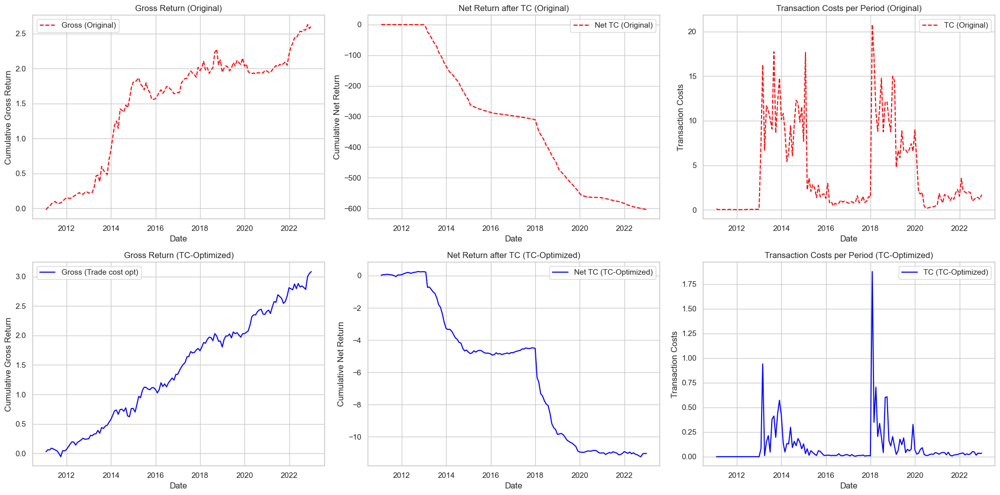

In [176]:
# Kopier dataframe for Markowitz-ML
tpf_data = tpf_original["pf"].copy()

# Beregn kumulative afkast for Markowitz-ML
tpf_data['cumret'] = tpf_data['r'].cumsum()
tpf_data['cumret_tc'] = (tpf_data['r'] - tpf_data['tc']).cumsum()

tpf_data_new = tpf_trans["pf"].copy()

# Beregn kumulative afkast for Markowitz-ML
tpf_data_new['cumret'] = tpf_data_new['r'].cumsum()
tpf_data_new['cumret_tc'] = (tpf_data_new['r'] - tpf_data_new['tc']).cumsum()

# Opret 3 subplots: Gross Return, Return net of TC og Periodiske Transaction Costs
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# --- Plot 1: Gross Return ---
ax = axes[0]
ax.plot(tpf_data['eom_ret'], tpf_data['cumret'], label='Gross (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Gross Return')
ax.set_title('Gross Return')
ax.grid(True)
ax.legend()

# --- Plot 2: Return net of TC ---
ax = axes[1]
ax.plot(tpf_data['eom_ret'], tpf_data['cumret_tc'], label='Net TC (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Net Return')
ax.set_title('Return net of TC')
ax.grid(True)
ax.legend()

# --- Plot 3: Periodiske Transaction Costs ---
ax = axes[2]
ax.plot(tpf_data['eom_ret'], tpf_data['tc'], label='TC (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Transaction Costs per Period')
ax.set_title('Periodic Transaction Costs')
ax.grid(True)
ax.legend()

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "markowitz_ml_original.png"), dpi=300, bbox_inches='tight')
plt.show()

# Opret 3 subplots: Gross Return, Return net of TC og Periodiske Transaction Costs
fig, axes = plt.subplots(1, 3, figsize=(20, 6))
# --- Plot 1: Gross Return ---
ax = axes[0]
ax.plot(tpf_data['eom_ret'], tpf_data_new['cumret'], label='Gross (Markowitz-ML trade cost opt)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Gross Return')
ax.set_title('Gross Return')
ax.grid(True)
ax.legend()

# --- Plot 2: Return net of TC ---
ax = axes[1]
ax.plot(tpf_data['eom_ret'], tpf_data_new['cumret_tc'], label='Net TC (Markowitz-ML trade cost opt)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Net Return')
ax.set_title('Return net of TC')
ax.grid(True)
ax.legend()

# --- Plot 3: Periodiske Transaction Costs ---
ax = axes[2]
ax.plot(tpf_data['eom_ret'], tpf_data_new['tc'], label='TC (Markowitz-ML trade cost opt)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Transaction Costs per Period')
ax.set_title('Periodic Transaction Costs')
ax.grid(True)
ax.legend()

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "markowitz_ml_trans_opt.png"), dpi=300, bbox_inches='tight')
plt.show()

# Beregn kumulative afkast for begge
tpf_data = tpf_original["pf"].copy()
tpf_data['cumret'] = tpf_data['r'].cumsum()
tpf_data['cumret_tc'] = (tpf_data['r'] - tpf_data['tc']).cumsum()

tpf_data_new = tpf_trans["pf"].copy()
tpf_data_new['cumret'] = tpf_data_new['r'].cumsum()
tpf_data_new['cumret_tc'] = (tpf_data_new['r'] - tpf_data_new['tc']).cumsum()

# Opret samlet plot med 2 rækker (original og trade-cost-opt) og 3 kolonner
fig, axes = plt.subplots(2, 3, figsize=(20, 10))

# --- Øverste række: Original Markowitz-ML ---
axes[0, 0].plot(tpf_data['eom_ret'], tpf_data['cumret'], label='Gross (Original)', color='red', linestyle='--')
axes[0, 0].set_title('Gross Return (Original)')
axes[0, 0].set_xlabel('Date')
axes[0, 0].set_ylabel('Cumulative Gross Return')
axes[0, 0].legend()
axes[0, 0].grid(True)

axes[0, 1].plot(tpf_data['eom_ret'], tpf_data['cumret_tc'], label='Net TC (Original)', color='red', linestyle='--')
axes[0, 1].set_title('Net Return after TC (Original)')
axes[0, 1].set_xlabel('Date')
axes[0, 1].set_ylabel('Cumulative Net Return')
axes[0, 1].legend()
axes[0, 1].grid(True)

axes[0, 2].plot(tpf_data['eom_ret'], tpf_data['tc'], label='TC (Original)', color='red', linestyle='--')
axes[0, 2].set_title('Transaction Costs per Period (Original)')
axes[0, 2].set_xlabel('Date')
axes[0, 2].set_ylabel('Transaction Costs')
axes[0, 2].legend()
axes[0, 2].grid(True)

# --- Nederste række: Trade Cost Optimeret ---
axes[1, 0].plot(tpf_data['eom_ret'], tpf_data_new['cumret'], label='Gross (Trade cost opt)', color='blue', linestyle='-')
axes[1, 0].set_title('Gross Return (TC-Optimized)')
axes[1, 0].set_xlabel('Date')
axes[1, 0].set_ylabel('Cumulative Gross Return')
axes[1, 0].legend()
axes[1, 0].grid(True)

axes[1, 1].plot(tpf_data['eom_ret'], tpf_data_new['cumret_tc'], label='Net TC (TC-Optimized)', color='blue', linestyle='-')
axes[1, 1].set_title('Net Return after TC (TC-Optimized)')
axes[1, 1].set_xlabel('Date')
axes[1, 1].set_ylabel('Cumulative Net Return')
axes[1, 1].legend()
axes[1, 1].grid(True)

axes[1, 2].plot(tpf_data['eom_ret'], tpf_data_new['tc'], label='TC (TC-Optimized)', color='blue', linestyle='-')
axes[1, 2].set_title('Transaction Costs per Period (TC-Optimized)')
axes[1, 2].set_xlabel('Date')
axes[1, 2].set_ylabel('Transaction Costs')
axes[1, 2].legend()
axes[1, 2].grid(True)

# Fælles layout og gem
plt.tight_layout()
plt.savefig(os.path.join(output_folder, "markowitz_ml_trans_opt_combined.png"), dpi=300, bbox_inches='tight')

### Udvikling af vægte over tid for original Markowitz vs trade cost optimeret Markowitz

In [186]:
def plot_specific_ids(df, id_list=None, weight_col='w', ax=None, show_legend=True):
    """
    Plotter 'weight_col' for de ID'er, der findes i id_list.
    Hvis id_list er None, plottes alle ID'er.
    Kan også plotte direkte på given matplotlib-akse (ax).
    """
    if id_list is None:
        id_list = df['id'].unique().tolist()
    
    # Filtrér til de ønskede id'er
    df_sub = df[df['id'].isin(id_list)].copy()
    df_sub = df_sub.sort_values('eom')
    
    # Pivotér så index = eom, columns = id, values = weight_col
    pivot_df = df_sub.pivot(index='eom', columns='id', values=weight_col)

    # Plot
    if ax is not None:
        pivot_df.plot(ax=ax, legend=show_legend)
        ax.set_title(f"Udvikling i {weight_col} for ID'er")
        ax.set_xlabel("Dato")
        ax.set_ylabel(weight_col)
        if show_legend:
            ax.legend(title="ID", fontsize=9)
    else:
        pivot_df.plot(figsize=(10, 6), legend=show_legend)
        plt.title(f"Udvikling i {weight_col} for ID'er")
        plt.xlabel("Dato")
        plt.ylabel(weight_col)
        if show_legend:
            plt.legend(title="ID", fontsize=9)
        plt.show()


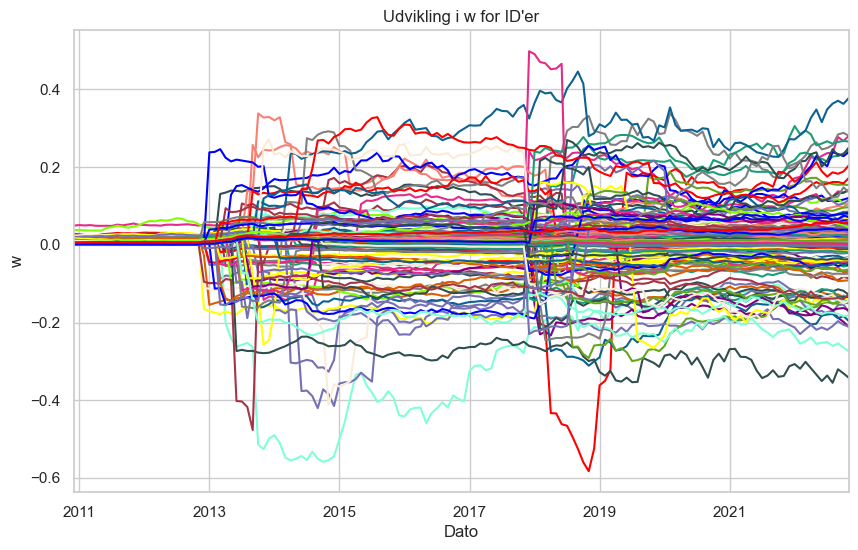

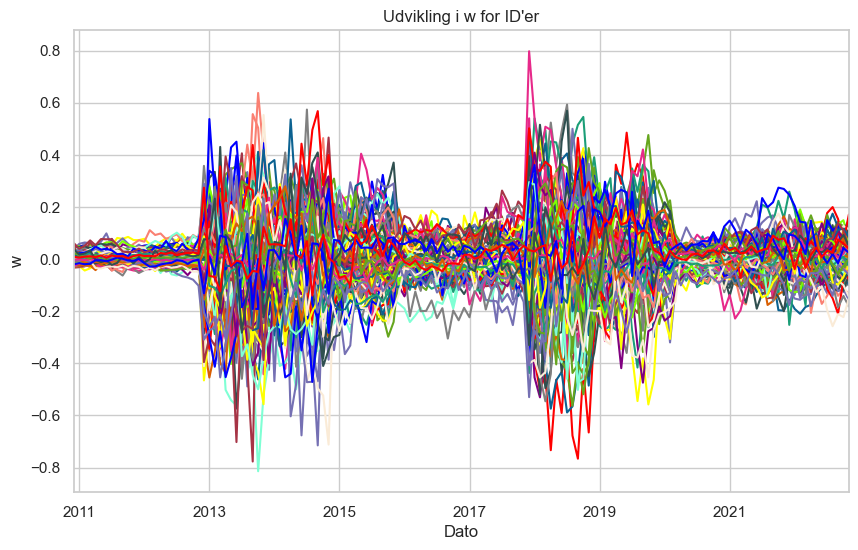

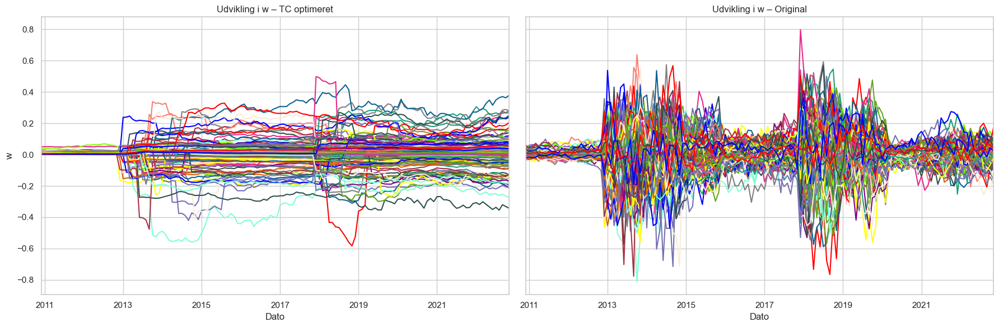

In [188]:
plot_specific_ids(tpf_trans["w"], id_list=None, weight_col='w', show_legend=False)
plot_specific_ids(tpf_original["w"], id_list=None, weight_col='w', show_legend=False)
# Opret side-by-side subplot
fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

# Plot tpf_trans (optimeret)
plot_specific_ids(tpf_trans["w"], id_list=None, weight_col="w", ax=axes[0], show_legend=False)
axes[0].set_title("Udvikling i w – TC optimeret")
axes[0].set_xlabel("Dato")
axes[0].set_ylabel("w")

# Plot tpf_original
plot_specific_ids(tpf_original["w"], id_list=None, weight_col="w", ax=axes[1], show_legend=False)
axes[1].set_title("Udvikling i w – Original")
axes[1].set_xlabel("Dato")

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "w_udvikling_trans_opt"), dpi=300, bbox_inches='tight')
plt.show()

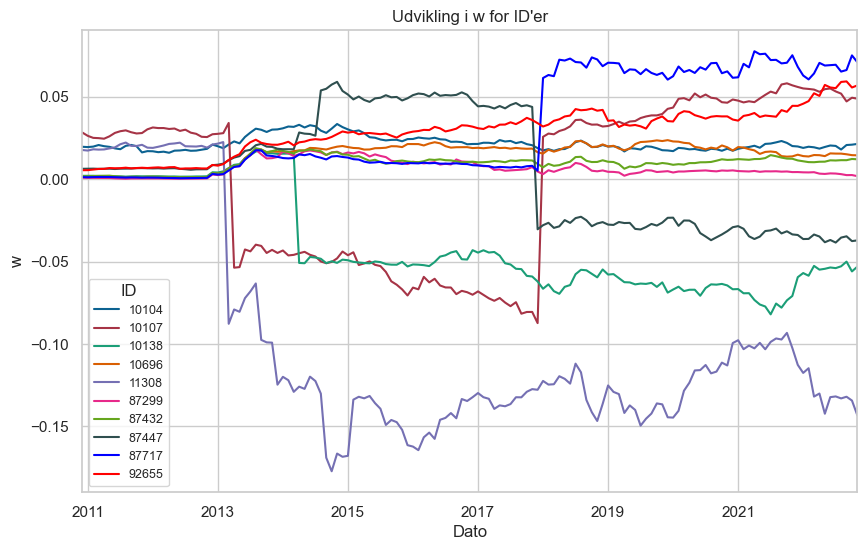

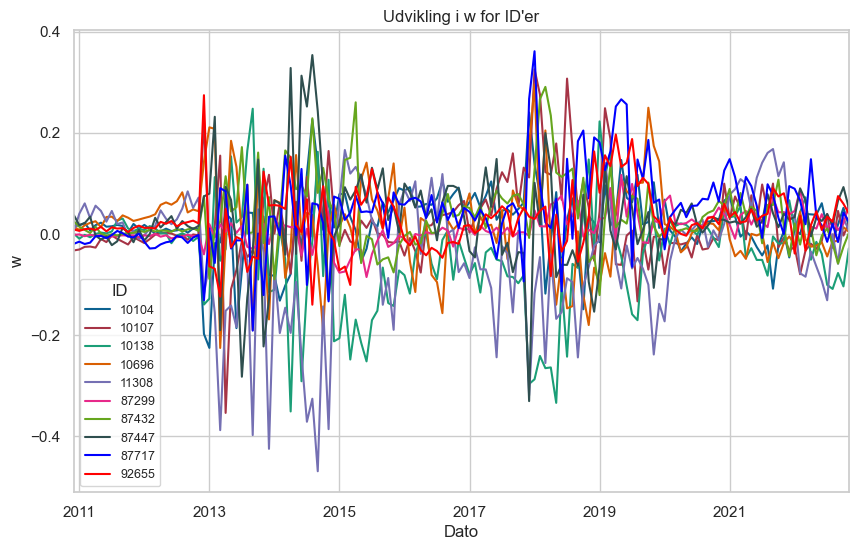

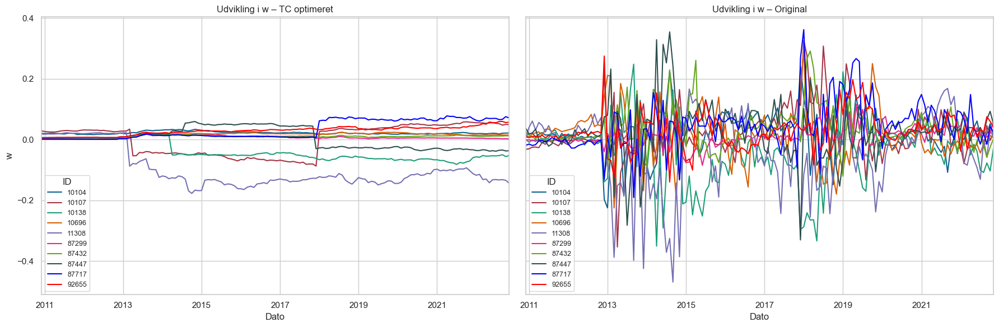

In [189]:
my_ids = [10104, 10107, 10138, 10696, 11308, 87299, 87432, 87447, 87717, 92655]
plot_specific_ids(tpf_trans["w"], my_ids, weight_col='w') 
plot_specific_ids(tpf_original["w"], my_ids, weight_col='w')  

fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

# Plot TC-optimeret
plot_specific_ids(tpf_trans["w"], my_ids, weight_col='w', ax=axes[0], show_legend=True)
axes[0].set_title("Udvikling i w – TC optimeret")
axes[0].set_xlabel("Dato")
axes[0].set_ylabel("w")

# Plot original
plot_specific_ids(tpf_original["w"], my_ids, weight_col='w', ax=axes[1], show_legend=True)
axes[1].set_title("Udvikling i w – Original")
axes[1].set_xlabel("Dato")

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "w_udvikling_trans_opt_udvalgte.png"), dpi=300, bbox_inches='tight')
plt.show()


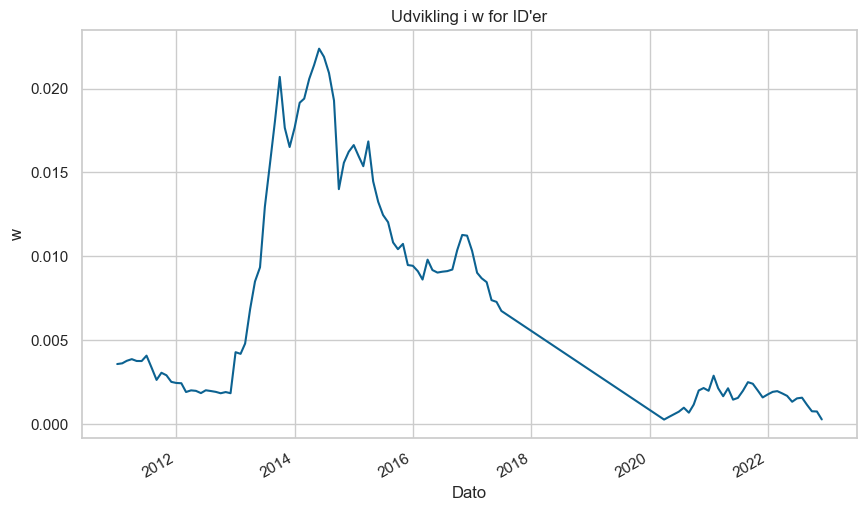

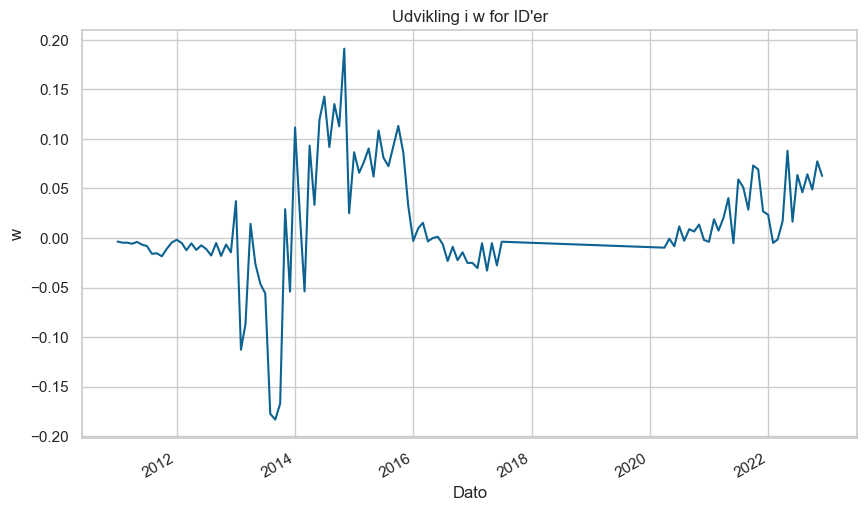

In [140]:
#Check af id som forsvinder: 75034 "denne fjernes i midt 2017, så den burde ikke være med eller i det mindste være lig 0 
my_ids2 = [75034]
plot_specific_ids(tpf_trans["w"], my_ids2, weight_col='w') 
plot_specific_ids(tpf_original["w"], my_ids2, weight_col='w') 

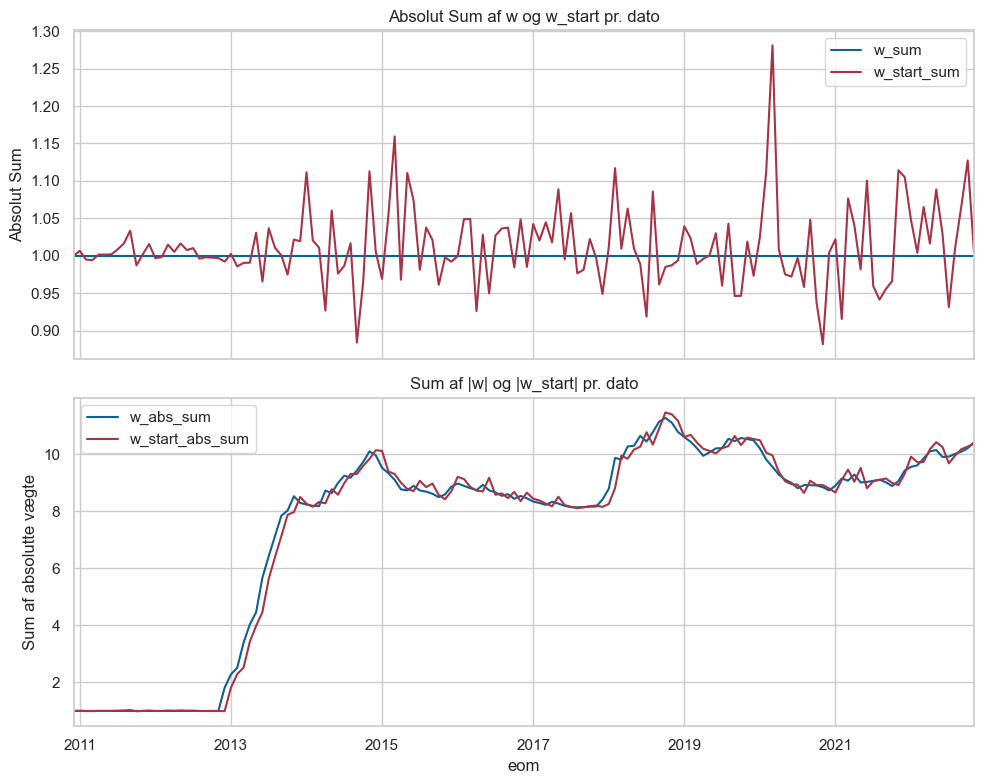

In [141]:
df = tpf_trans["w"].copy()

# 1) Gruppér pr. dato (eom) og beregn sum af w, sum af w_start,
#    samt sum af |w| og sum af |w_start|
df_agg = df.groupby("eom").agg({
    "w": ["sum", lambda x: x.abs().sum()],
    "w_start": ["sum", lambda x: x.abs().sum()]
})

# 2) Giv kolonnerne mere sigende navne
df_agg.columns = ["w_sum", "w_abs_sum", "w_start_sum", "w_start_abs_sum"]

# 3) Plot
fig, ax = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

# Plot sum(w) og sum(w_start) i øverste subplot
df_agg[["w_sum", "w_start_sum"]].plot(ax=ax[0])
ax[0].set_title("Absolut Sum af w og w_start pr. dato")
ax[0].set_ylabel("Absolut Sum")

# Plot sum(|w|) og sum(|w_start|) i nederste subplot
df_agg[["w_abs_sum", "w_start_abs_sum"]].plot(ax=ax[1])
ax[1].set_title("Sum af |w| og |w_start| pr. dato")
ax[1].set_ylabel("Sum af absolutte vægte")

plt.tight_layout()
plt.show()


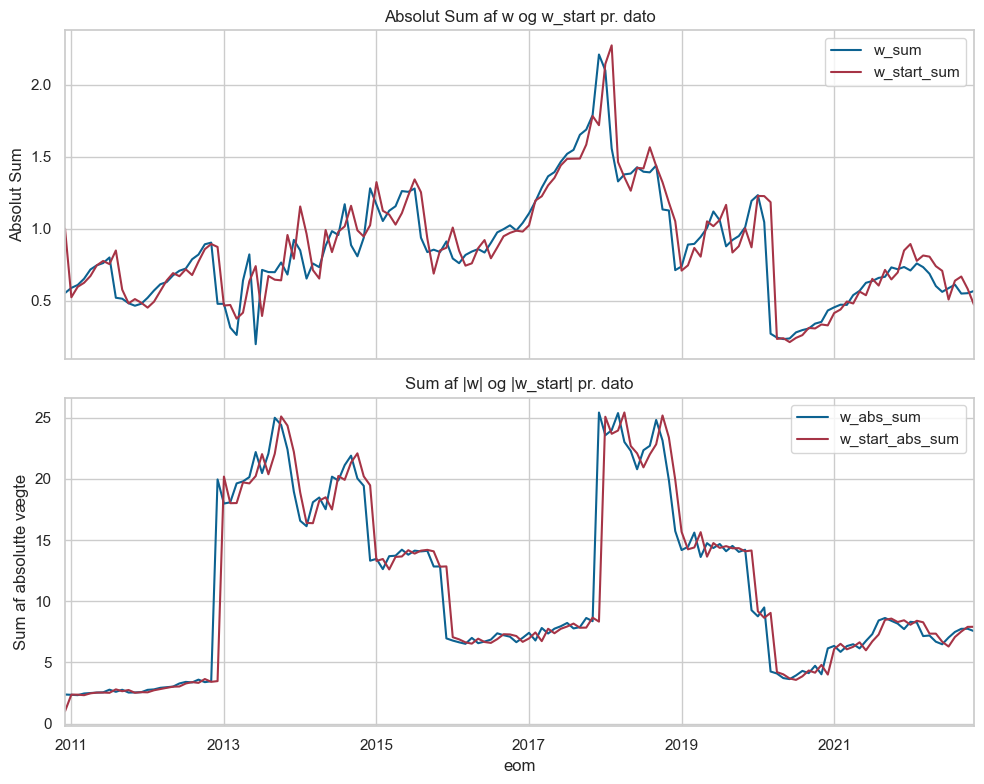

In [142]:
df = tpf_original["w"].copy()

# 1) Gruppér pr. dato (eom) og beregn sum af w, sum af w_start,
#    samt sum af |w| og sum af |w_start|
df_agg = df.groupby("eom").agg({
    "w": ["sum", lambda x: x.abs().sum()],
    "w_start": ["sum", lambda x: x.abs().sum()]
})

# 2) Giv kolonnerne mere sigende navne
df_agg.columns = ["w_sum", "w_abs_sum", "w_start_sum", "w_start_abs_sum"]

# 3) Plot
fig, ax = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

# Plot sum(w) og sum(w_start) i øverste subplot
df_agg[["w_sum", "w_start_sum"]].plot(ax=ax[0])
ax[0].set_title("Absolut Sum af w og w_start pr. dato")
ax[0].set_ylabel("Absolut Sum")

# Plot sum(|w|) og sum(|w_start|) i nederste subplot
df_agg[["w_abs_sum", "w_start_abs_sum"]].plot(ax=ax[1])
ax[1].set_title("Sum af |w| og |w_start| pr. dato")
ax[1].set_ylabel("Sum af absolutte vægte")

plt.tight_layout()
plt.show()


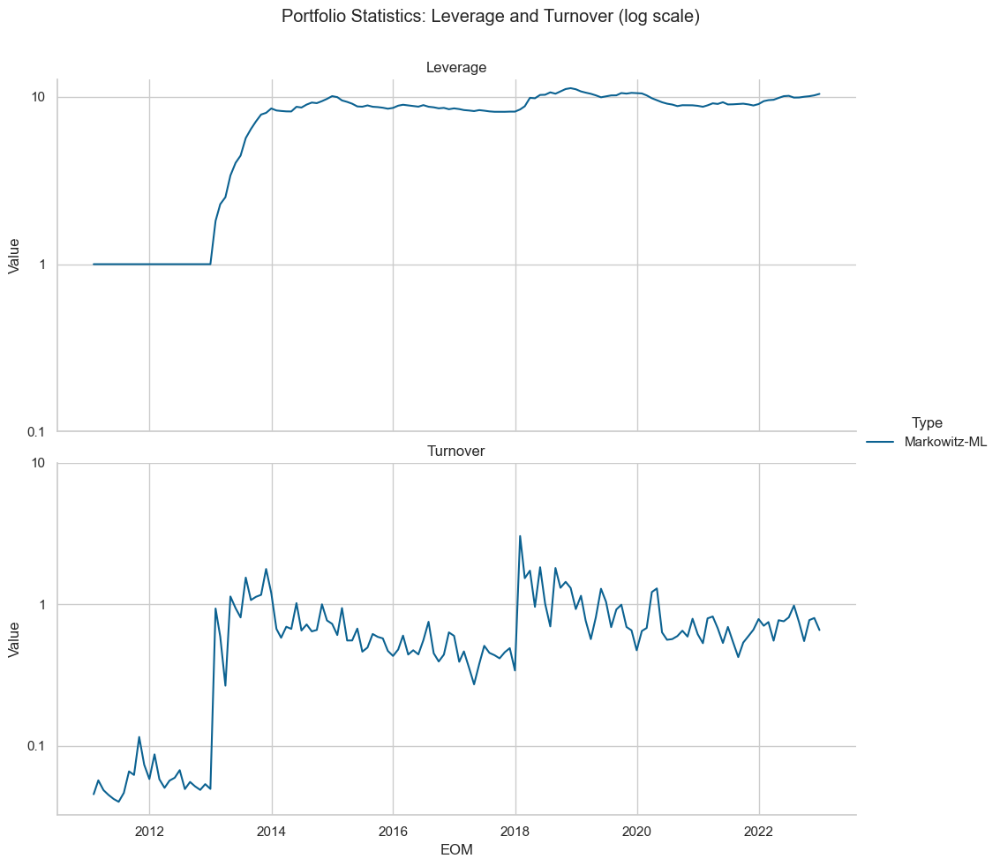

In [143]:
# 1. Kopier data for Markowitz-ML
tpf_pf = tpf_trans['pf'].copy()

# 2. Sæt type-kolonnen til "Markowitz-ML"
tpf_pf["type"] = "Markowitz-ML"

# 3. Vælg de relevante kolonner: eom_ret, inv og turnover (samt type)
ws = tpf_pf[['eom_ret', 'inv', 'turnover', 'type']].copy()

# 4. Omdøb eom_ret til eom for korthed
ws.rename(columns={'eom_ret': 'eom'}, inplace=True)

# 5. Konverter til long format, så vi kan plotte Leverage og Turnover i separate paneler
ws_long = ws.melt(
    id_vars=['type', 'eom'],
    value_vars=['inv', 'turnover'],
    var_name='metric',
    value_name='value'
)

# 6. Omdøb metric-værdier til pænere navne
ws_long['metric'] = ws_long['metric'].map({
    'inv': 'Leverage',
    'turnover': 'Turnover'
})

# 7. Plot med Seaborn's FacetGrid
g = sns.FacetGrid(ws_long, col="metric", col_wrap=1, sharey=False, height=5, aspect=2)
g.map_dataframe(sns.lineplot, x="eom", y="value", hue="type", style="type")

# Sæt y-aksen til log-skala
g.set(yscale="log")

# Fjern "metric = " i facettitlen
g.set_titles("{col_name}")

# Tilføj en fælles legend
g.add_legend(title="Type")

# Angiv egne ticks på y-aksen
for ax in g.axes.flatten():
    ax.set_yticks([0.1, 1, 10])
    ax.set_yticklabels(['0.1', '1', '10'])

# Sæt akse-labels og en overordnet titel
g.set_axis_labels("EOM", "Value")
plt.subplots_adjust(top=0.9)
g.fig.suptitle("Portfolio Statistics: Leverage and Turnover (log scale)")

plt.show()


In [144]:
print(tpf_trans['w'][tpf_trans['w']["id"] == 75034])

          id        eom    w_start          w      tr_ld1      mu_ld1
101    75034 2010-12-31 0.00305899 0.00357518         NaN         NaN
281    75034 2011-01-31 0.00420023 0.00361808  0.19838985  0.02005247
461    75034 2011-02-28 0.00361954 0.00376758  0.03924235  0.03882076
641    75034 2011-03-31 0.00388078 0.00386680  0.03353050  0.00338251
821    75034 2011-04-30 0.00396683 0.00375737  0.05424833  0.02766186
...      ...        ...        ...        ...         ...         ...
25068  75034 2022-07-31 0.00124299 0.00156868 -0.11036095  0.09363012
25247  75034 2022-08-31 0.00160995 0.00114017 -0.01083242 -0.03618817
25426  75034 2022-09-30 0.00104118 0.00075794 -0.17025866 -0.09136964
25605  75034 2022-10-31 0.00092467 0.00074563  0.31922955  0.08135025
25785  75034 2022-11-30 0.00074857 0.00027290  0.05548162  0.05132895

[112 rows x 6 columns]


In [145]:
with pd.option_context('display.max_rows', None):
    print(tpf_trans['w'][tpf_trans['w']["id"] == 10107])


          id        eom     w_start           w      tr_ld1      mu_ld1
1      10107 2010-12-31  0.02909715  0.02831842         NaN         NaN
181    10107 2011-01-31  0.02757866  0.02633252 -0.00659443  0.02005247
361    10107 2011-02-28  0.02444735  0.02511047 -0.03554952  0.03882076
541    10107 2011-03-31  0.02390622  0.02494751 -0.04473752  0.00338251
721    10107 2011-04-30  0.02478388  0.02459635  0.02092139  0.02766186
901    10107 2011-05-31  0.02424980  0.02605586 -0.02894818 -0.01507072
1081   10107 2011-06-30  0.02760689  0.02811552  0.03954916 -0.01885551
1261   10107 2011-07-31  0.03036725  0.02914785  0.05387414 -0.02427067
1441   10107 2011-08-31  0.03028815  0.02966423 -0.02344064 -0.06020673
1621   10107 2011-09-30  0.03034144  0.02853351 -0.06418475 -0.08507211
1801   10107 2011-10-31  0.02735460  0.02777578  0.06989358  0.11600331
1981   10107 2011-11-30  0.02703377  0.02804030 -0.03192286 -0.00535172
2161   10107 2011-12-31  0.02837631  0.03030212  0.01485532  0.0

In [146]:
with pd.option_context('display.max_rows', None):
    print(tpf_original['w'][tpf_original['w']["id"] == 10107]) #75034

        id        eom     w_start           w      tr_ld1      mu_ld1
144  10107 2010-12-31  0.02909715 -0.03242446         NaN         NaN
145  10107 2011-01-31 -0.03157744 -0.03059713 -0.00659443  0.02005247
146  10107 2011-02-28 -0.02840665 -0.02533762 -0.03554952  0.03882076
147  10107 2011-03-31 -0.02412248 -0.02474789 -0.04473752  0.00338251
148  10107 2011-04-30 -0.02458557 -0.02682316  0.02092139  0.02766186
149  10107 2011-05-31 -0.02644523 -0.00976981 -0.02894818 -0.01507072
150  10107 2011-06-30 -0.01035138 -0.01592783  0.03954916 -0.01885551
151  10107 2011-07-31 -0.01720347 -0.00279001  0.05387414 -0.02427067
152  10107 2011-08-31 -0.00289916 -0.00960132 -0.02344064 -0.06020673
153  10107 2011-09-30 -0.00982051 -0.01518227 -0.06418475 -0.08507211
154  10107 2011-10-31 -0.01455499 -0.02068532  0.06989358  0.11600331
155  10107 2011-11-30 -0.02013273 -0.00625333 -0.03192286 -0.00535172
156  10107 2011-12-31 -0.00632827 -0.01191060  0.01485532  0.00283817
157  10107 2012-01-3

In [395]:
#w_opt['w'] * (1 + w_opt['tr_ld1']) / (1 + w_opt['mu_ld1'])
#print(-(0.004710)* (1 + 0.039242) / (1 + 0.038821))

-0.00471190880815848


In [ ]:
w_start_eks = 0.012686
w_eks = 0.009032
d_eks = pd.Timestamp('2011-01-31')
wealth_eks = #wealth.loc[wealth['eom'] == d_eks, 'wealth'].iloc[0]
lambda_eks = lambda_list['2011-01-31'][10104]
tc_eks = (wealth_eks / 2) * np.sum(lambda_eks * ((w_eks - w_start_eks) ** 2))
print("wealth:",wealth_eks)
print("lambda:",lambda_eks)
print("tc:",tc_eks)

# Markowitz-ML med gearing begrænsninger så kun long only

In [147]:
def tpf_implement_long_only(data, cov_list, wealth, dates, gam):
    """
    Beregner tangency portfolio weights og porteføljestatistikker med constraints:
      - Ingen shorting: w >= 0
      - Summering til 1: sum(w) == 1

    Parametre:
      - data: DataFrame med kolonnerne 'id', 'eom', 'me', 'tr_ld1', 'pred_ld1' og 'valid'
      - cov_list: dictionary med nøgler som datoer (som strings, fx '2019-12-31') og værdier,
                  hvor hvert element er en dictionary med nøglerne 'fct_load', 'fct_cov' og 'ivol_vec'
      - wealth: DataFrame med kolonnerne 'eom', 'mu_ld1' og 'wealth'
      - dates: liste over datoer (som pd.Timestamp eller strings)
      - gam: risikoaversion parameter

    Returnerer:
      - en dictionary med nøglerne "w" (de faktiske vægte) og "pf" (porteføljestatistikker)
    """
    # Filtrer data for gyldige rækker med eom i dates
    data_rel = data[(data['valid'] == True) & (data['eom'].isin(dates))][['id', 'eom', 'me', 'tr_ld1', 'pred_ld1']]
    data_rel = data_rel.sort_values(by=['id', 'eom'])
    
    # Opdel data_rel i grupper pr. eom
    data_split = {d: df for d, df in data_rel.groupby('eom')}
    tpf_opt_list = []

    for d in dates:
        # Konverter d til string, hvis d er en pd.Timestamp (cov_list-nøglerne forventes som strings)
        if isinstance(d, pd.Timestamp):
            d_key = d.strftime('%Y-%m-%d')
        else:
            d_key = d

        data_sub = data_split.get(d)
        if data_sub is None or data_sub.empty:
            continue

        ids = data_sub['id'].tolist()

        # Brug standalone funktionen create_cov her
        sigma = General_Functions.create_cov(cov_list[d_key], ids=ids)

        # Hent prediktioner for den aktuelle dato
        pred_vector = data_sub['pred_ld1'].values
        n = len(pred_vector)
        
        # Optimer med CVXPY: maksimer pred_vector' * w - 0.5*gam * w' * sigma * w
        # under constraints: sum(w) == 1 og w >= 0
        w_var = cp.Variable(n)
        objective = cp.Maximize(pred_vector.T @ w_var - 0.5 * gam * cp.quad_form(w_var, sigma))
        constraints = [cp.sum(w_var) == 1, w_var >= 0]
        prob = cp.Problem(objective, constraints)
        prob.solve(solver=cp.OSQP)

        if w_var.value is None:
            raise ValueError(f"Optimeringsproblemet for dato {d} kunne ikke løses.")
        weights = w_var.value

        temp_df = data_sub[['id', 'eom']].copy()
        temp_df['w'] = weights
        tpf_opt_list.append(temp_df)

    if tpf_opt_list:
        tpf_opt = pd.concat(tpf_opt_list, ignore_index=True)
    else:
        tpf_opt = pd.DataFrame(columns=['id', 'eom', 'w'])

    # Beregn de faktiske vægte vha. w_fun (forventes defineret et andet sted)
    tpf_w = portfolio_choice_functions.w_fun(data_rel, dates, tpf_opt, wealth)
    # Beregn porteføljestatistikker vha. pf_ts_fun (forventes defineret et andet sted)
    tpf_pf = General_Functions.pf_ts_fun(tpf_w, data, wealth, gam)
    tpf_pf['type'] = "Markowitz-ML-no-shorting"

    return {"w": tpf_w, "pf": tpf_pf}


In [148]:
tpf_longonly = tpf_implement_long_only(data=chars, cov_list=barra_cov, wealth=wealth, dates=dates_oos, gam=pf_set["gamma_rel"])

In [149]:
tpf_longonly['w']

,id,eom,w_start,w,tr_ld1,mu_ld1
0,10104,2010-12-31,0.01962004,-0.00000000,NaN,NaN
1,10104,2011-01-31,-0.00000000,0.01073527,0.02495411,0.02005247
2,10104,2011-02-28,0.01061456,0.00000000,0.02714012,0.03882076
3,10104,2011-03-31,0.00000000,-0.00000000,0.01621833,0.00338251
4,10104,2011-04-30,-0.00000000,-0.00000000,0.07744176,0.02766186
...,...,...,...,...,...,...
25859,92655,2022-07-31,-0.00000000,0.00000000,0.05568431,0.09363012
25860,92655,2022-08-31,0.00000000,-0.00000000,-0.04352827,-0.03618817
25861,92655,2022-09-30,-0.00000000,0.00417941,-0.02436807,-0.09136964
25862,92655,2022-10-31,0.00424683,0.00000000,0.09879290,0.08135025


# Markowitz-ML med transactions cost optimering og gearing begrænsninger på de optimale vægte (så kun long-only pf)

In [161]:

def tpf_implement_qp(data, cov_list, wealth, dates, gam, delta, alpha):
    """
    Beregner porteføljens vægte dato-for-dato med:
      - En long-only Markowitz-ML-model til at finde w_opt (non-shorting),
      - En QP, der sikrer, at w_final ligger inden for ±delta af w_opt,
      - Og som minimerer en kombineret objektfunktion:
            alpha * ||w - w_opt||^2 + (1 - alpha)* sum(lam * (w - w_start)^2)
        hvor w_start er den afkastjusterede vægt fra forrige periode.
    
    Parametre:
      - data: DataFrame med aktiedata
      - cov_list: dictionary med kovariansmatricer (nøgle: dato, som string)
      - wealth: DataFrame med wealth og mu_ld1 for hver dato
      - dates: liste over datoer (som pd.Timestamp eller strings)
      - gam: risikoaversion parameter
      - delta: maks. afvigelse fra w_opt (f.eks. 0.2)
      - alpha: vægtning mellem at holde sig tæt på w_opt og minimere transaktionsomkostninger
      
    Returnerer:
      - tpf_opt: DataFrame med kolonnerne ['id', 'eom', 'w'] for hver dato.
    """
    # Filtrer og sorter data
    data_rel = data[(data['valid'] == True) & (data['eom'].isin(dates))][['id', 'eom', 'me', 'tr_ld1', 'pred_ld1']]
    data_rel = data_rel.sort_values(by=['id', 'eom'])
    data_split = {d: df for d, df in data_rel.groupby('eom')}
    
    # Helper-funktion til afkastjustering af w_prev (fra forrige periode)
    def adjust_w_prev_for_returns(w_prev_series, df_current, wealth_current):
        df_current = df_current.set_index('id')
        w_prev_aligned = w_prev_series.reindex(df_current.index).fillna(0)
        tr_ld1 = df_current['tr_ld1']
        mu_ld1 = wealth_current['mu_ld1'].iloc[0]  # antager én værdi pr. dato
        return w_prev_aligned * (1 + tr_ld1) / (1 + mu_ld1)

    tpf_opt_list = []
    
    # For den første dato: brug initiale VW-vægte
    first_date = dates[0]
    data_first = data_split[first_date]
    init_w = General_Functions.initial_weights_new(data_first, w_type="vw")
    # Gem som Series med id som index
    w_prev_final = pd.Series(init_w['w_start'].values, index=init_w['id'])

    for d in dates:
        # Lav nøglen til cov_list
        d_key = d.strftime('%Y-%m-%d') if isinstance(d, pd.Timestamp) else d
        data_sub = data_split.get(d)
        if data_sub is None or data_sub.empty:
            continue

        ids = data_sub['id'].tolist()
        sigma = General_Functions.create_cov(cov_list[d_key], ids=ids)
        pred_vector = data_sub['pred_ld1'].values
        n = len(pred_vector)
        
        # 1) Beregn long-only w_opt ved at løse:
        #    max  pred_vector' * w - 0.5*gam*w' Sigma w
        #    s.t. sum(w)=1, w >= 0
        w_var = cp.Variable(n)
        objective = cp.Maximize(pred_vector.T @ w_var - 0.5 * gam * cp.quad_form(w_var, sigma))
        constraints_long = [cp.sum(w_var) == 1, w_var >= 0]
        prob_long = cp.Problem(objective, constraints_long)
        prob_long.solve(solver=cp.OSQP)
        if w_var.value is None:
            raise ValueError(f"Long-only Markowitz-problem for dato {d} kunne ikke løses.")
        w_opt = w_var.value
        
        # 2) Juster forrige periodes vægte (w_prev_final) for afkast
        wealth_d = wealth.loc[wealth['eom'] == d]
        w_start = adjust_w_prev_for_returns(w_prev_final, data_sub, wealth_d)
        
        # 3) Løs QP for transaktionsomkostninger med de nye constraints (long-only: w >= 0)
        #    min  alpha*||w - w_opt||^2 + (1-alpha)* sum(lam*(w - w_start)^2)
        #    s.t. w_i in [w_opt_i - delta, w_opt_i + delta], sum(w)=1, w >= 0
        lam = data_sub['lambda'].values if 'lambda' in data_sub.columns else np.ones_like(w_opt)
        w = cp.Variable(n)
        obj = alpha * cp.sum_squares(w - w_opt) + (1 - alpha) * cp.sum(cp.multiply(lam, cp.square(w - w_start)))
        constraints = [
            w >= w_opt - delta,
            w <= w_opt + delta,
            cp.sum(w) == 1,
            w >= 0
        ]
        prob = cp.Problem(cp.Minimize(obj), constraints)
        prob.solve(solver=cp.OSQP)
        if w.value is None:
            raise ValueError(f"Optimeringsproblemet for dato {d} kunne ikke løses.")
        w_final = w.value
        
        # 4) Gem resultater for denne dato
        temp_df = data_sub[['id', 'eom']].copy()
        temp_df['w'] = w_final
        tpf_opt_list.append(temp_df)
        
        # 5) Opdater w_prev_final til næste periode
        w_prev_final = pd.Series(w_final, index=data_sub['id'])
    
    if tpf_opt_list:
        tpf_opt = pd.concat(tpf_opt_list, ignore_index=True)
    else:
        tpf_opt = pd.DataFrame(columns=['id','eom','w'])
    
    # Ekstra efterbehandling, hvis nødvendigt (f.eks. via w_fun_post)
    tpf_w = w_fun_post(tpf_opt, data, wealth)
    return tpf_opt  # Eller returnér en dict med "w" og "pf"

def w_fun_post(tpf_opt, data, wealth):
    """ Enkel version af w_fun - returnerer blot tpf_opt. """
    return tpf_opt


In [166]:
tpf_longonly_trans = run_markowitz_qp_pipeline(
    data=chars, 
    cov_list=barra_cov, 
    wealth=wealth, 
    dates=dates_oos, 
    gam=pf_set["gamma_rel"],
    delta=0.15,
    alpha=0
)


In [167]:
tpf_longonly_trans['w']

,id,eom,w_start,w,tr_ld1,mu_ld1
0,10104,2010-12-31,0.01962004,0.01969571,NaN,NaN
1,10107,2010-12-31,0.02909715,0.02831842,NaN,NaN
2,10138,2010-12-31,0.00207196,0.00205612,NaN,NaN
3,10696,2010-12-31,0.00106728,0.00108507,NaN,NaN
4,11308,2010-12-31,0.01894753,0.01773239,NaN,NaN
...,...,...,...,...,...,...
25859,87299,2022-11-30,0.00021671,-0.00000000,0.07337131,0.05132895
25860,87432,2022-11-30,0.00028896,-0.00000000,0.11964630,0.05132895
25861,87447,2022-11-30,0.00022735,-0.00000000,0.13939745,0.05132895
25862,87717,2022-11-30,0.09796795,0.08167360,0.19239239,0.05132895


# Relevante plots og stats for No gearing MVO vs trade cost no gearing optimeret MVO

In [192]:
df_metrics = compare_portfolio_metrics(tpf_longonly, tpf_longonly_trans)
display(df_metrics)
latex_table = df_metrics.to_latex(index=False, float_format="%.4f", caption="Sammenligning af porteføljemålepunkter", label="tab:portfolio_metrics")
print(latex_table)
latex_table = df_metrics.set_index("Metric").T.to_latex(
    float_format="%.4f",
    caption="Sammenligning af porteføljemålepunkter (transponeret)",
    label="tab:portfolio_metrics_transposed"
)
print(latex_table)

,Metric,Markowitz-ML,Markowitz-ML TC optimeret
0,r_yearly,0.13119244,0.19320955
1,std_yearly,0.12610565,0.12996114
2,SR_gross_yearly,1.04033755,1.48667172
3,tc_yearly,3.51664958,0.16118109
4,r_tc_yearly,-3.38545714,0.03202846
5,SR_net_yearly,-26.84619808,0.24644645
6,inv,1.00002878,1.00008427
7,Shorting,0.00001439,0.00004213
8,Turnover,0.96585397,0.09723924


\begin{table}
\caption{Sammenligning af porteføljemålepunkter}
\label{tab:portfolio_metrics}
\begin{tabular}{lrr}
\toprule
Metric & Markowitz-ML & Markowitz-ML TC optimeret \\
\midrule
r_yearly & 0.1312 & 0.1932 \\
std_yearly & 0.1261 & 0.1300 \\
SR_gross_yearly & 1.0403 & 1.4867 \\
tc_yearly & 3.5166 & 0.1612 \\
r_tc_yearly & -3.3855 & 0.0320 \\
SR_net_yearly & -26.8462 & 0.2464 \\
inv & 1.0000 & 1.0001 \\
Shorting & 0.0000 & 0.0000 \\
Turnover & 0.9659 & 0.0972 \\
\bottomrule
\end{tabular}
\end{table}

\begin{table}
\caption{Sammenligning af porteføljemålepunkter (transponeret)}
\label{tab:portfolio_metrics_transposed}
\begin{tabular}{lrrrrrrrrr}
\toprule
Metric & r_yearly & std_yearly & SR_gross_yearly & tc_yearly & r_tc_yearly & SR_net_yearly & inv & Shorting & Turnover \\
\midrule
Markowitz-ML & 0.1312 & 0.1261 & 1.0403 & 3.5166 & -3.3855 & -26.8462 & 1.0000 & 0.0000 & 0.9659 \\
Markowitz-ML TC optimeret & 0.1932 & 0.1300 & 1.4867 & 0.1612 & 0.0320 & 0.2464 & 1.0001 & 0.0000 & 0.0

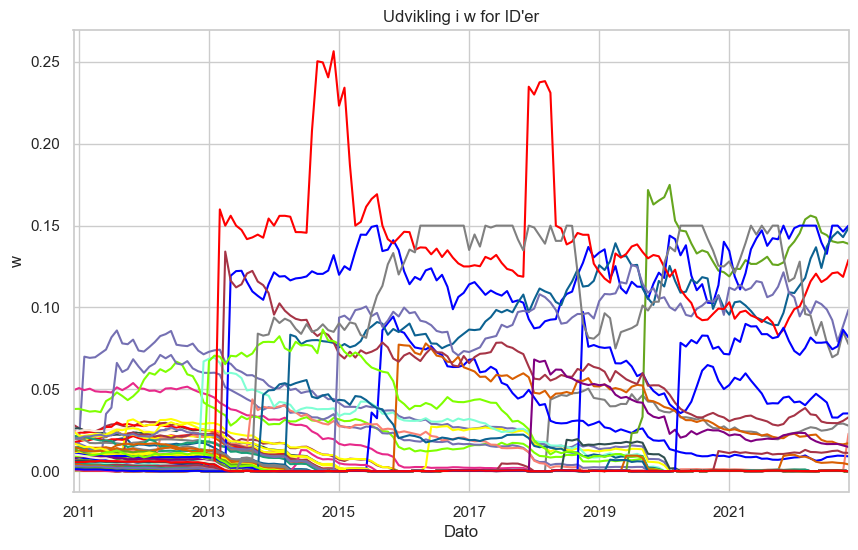

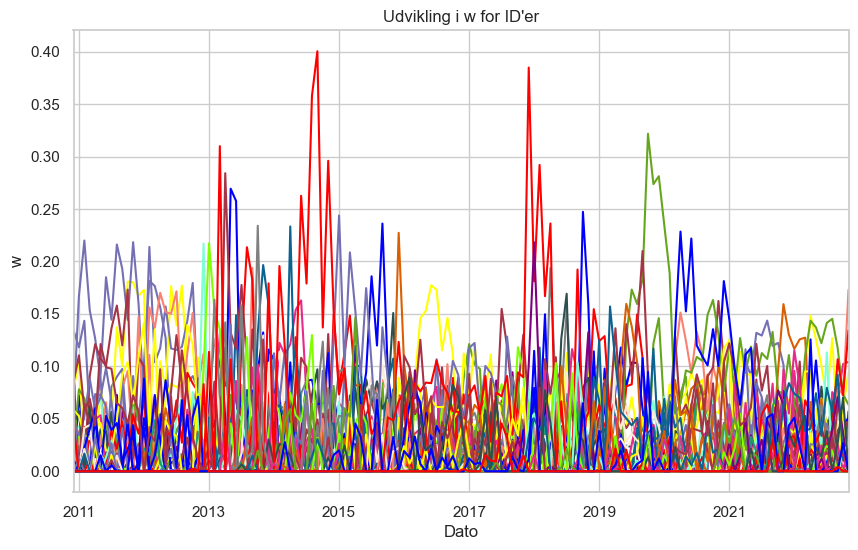

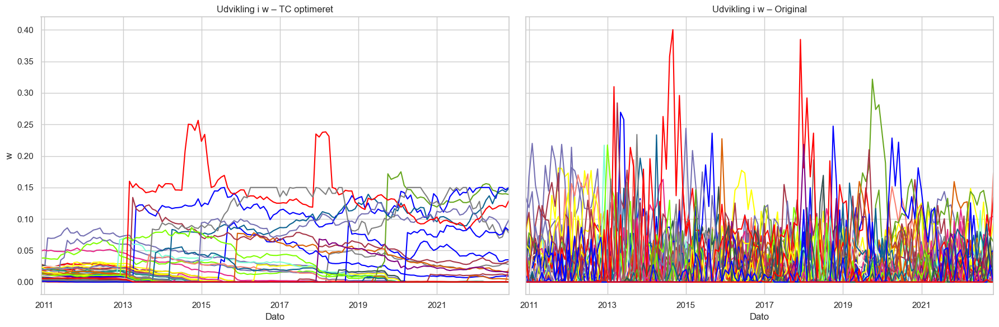

In [191]:
plot_specific_ids(tpf_longonly_trans["w"], id_list=None, weight_col='w', show_legend=False)
plot_specific_ids(tpf_longonly["w"], id_list=None, weight_col='w', show_legend=False)

fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

# Plot tpf_trans (optimeret)
plot_specific_ids(tpf_longonly_trans["w"], id_list=None, weight_col="w", ax=axes[0], show_legend=False)
axes[0].set_title("Udvikling i w – TC optimeret")
axes[0].set_xlabel("Dato")
axes[0].set_ylabel("w")

# Plot tpf_original
plot_specific_ids(tpf_longonly["w"], id_list=None, weight_col="w", ax=axes[1], show_legend=False)
axes[1].set_title("Udvikling i w – Original")
axes[1].set_xlabel("Dato")

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "w_udvikling_trans_gearing_opt"), dpi=300, bbox_inches='tight')
plt.show()


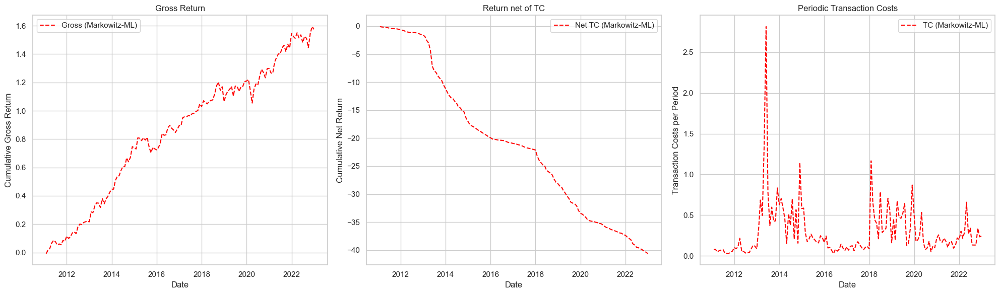

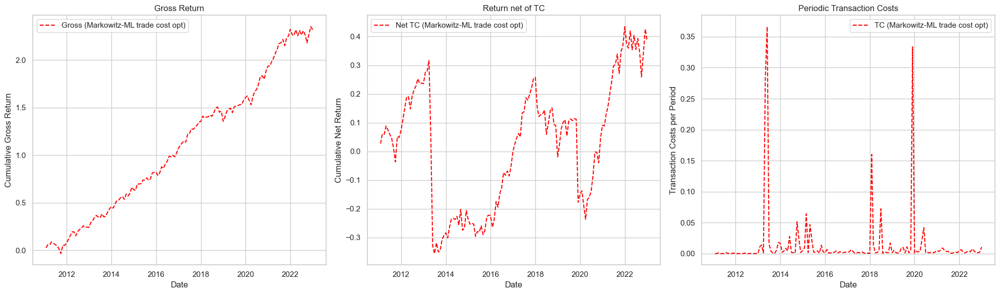

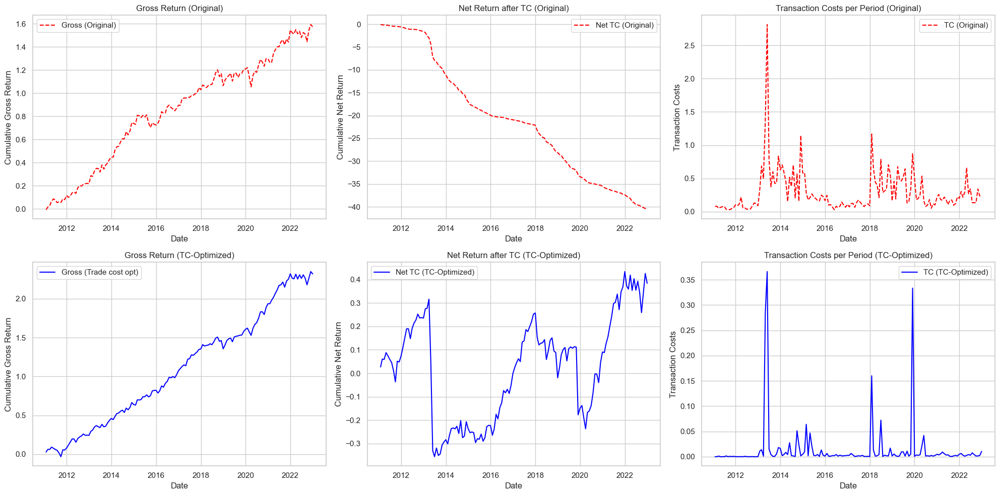

In [190]:
# Kopier dataframe for Markowitz-ML
tpf_data = tpf_longonly["pf"].copy()

# Beregn kumulative afkast for Markowitz-ML
tpf_data['cumret'] = tpf_data['r'].cumsum()
tpf_data['cumret_tc'] = (tpf_data['r'] - tpf_data['tc']).cumsum()

tpf_data_new = tpf_longonly_trans["pf"].copy()

# Beregn kumulative afkast for Markowitz-ML
tpf_data_new['cumret'] = tpf_data_new['r'].cumsum()
tpf_data_new['cumret_tc'] = (tpf_data_new['r'] - tpf_data_new['tc']).cumsum()

# Opret 3 subplots: Gross Return, Return net of TC og Periodiske Transaction Costs
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# --- Plot 1: Gross Return ---
ax = axes[0]
ax.plot(tpf_data['eom_ret'], tpf_data['cumret'], label='Gross (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Gross Return')
ax.set_title('Gross Return')
ax.grid(True)
ax.legend()

# --- Plot 2: Return net of TC ---
ax = axes[1]
ax.plot(tpf_data['eom_ret'], tpf_data['cumret_tc'], label='Net TC (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Net Return')
ax.set_title('Return net of TC')
ax.grid(True)
ax.legend()

# --- Plot 3: Periodiske Transaction Costs ---
ax = axes[2]
ax.plot(tpf_data['eom_ret'], tpf_data['tc'], label='TC (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Transaction Costs per Period')
ax.set_title('Periodic Transaction Costs')
ax.grid(True)
ax.legend()

plt.tight_layout()
plt.show()

# Opret 3 subplots: Gross Return, Return net of TC og Periodiske Transaction Costs
fig, axes = plt.subplots(1, 3, figsize=(20, 6))
# --- Plot 1: Gross Return ---
ax = axes[0]
ax.plot(tpf_data['eom_ret'], tpf_data_new['cumret'], label='Gross (Markowitz-ML trade cost opt)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Gross Return')
ax.set_title('Gross Return')
ax.grid(True)
ax.legend()

# --- Plot 2: Return net of TC ---
ax = axes[1]
ax.plot(tpf_data['eom_ret'], tpf_data_new['cumret_tc'], label='Net TC (Markowitz-ML trade cost opt)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Net Return')
ax.set_title('Return net of TC')
ax.grid(True)
ax.legend()

# --- Plot 3: Periodiske Transaction Costs ---
ax = axes[2]
ax.plot(tpf_data['eom_ret'], tpf_data_new['tc'], label='TC (Markowitz-ML trade cost opt)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Transaction Costs per Period')
ax.set_title('Periodic Transaction Costs')
ax.grid(True)
ax.legend()

plt.tight_layout()
plt.show()

# Opret samlet plot med 2 rækker (original og trade-cost-opt) og 3 kolonner
fig, axes = plt.subplots(2, 3, figsize=(20, 10))

# --- Øverste række: Original Markowitz-ML ---
axes[0, 0].plot(tpf_data['eom_ret'], tpf_data['cumret'], label='Gross (Original)', color='red', linestyle='--')
axes[0, 0].set_title('Gross Return (Original)')
axes[0, 0].set_xlabel('Date')
axes[0, 0].set_ylabel('Cumulative Gross Return')
axes[0, 0].legend()
axes[0, 0].grid(True)

axes[0, 1].plot(tpf_data['eom_ret'], tpf_data['cumret_tc'], label='Net TC (Original)', color='red', linestyle='--')
axes[0, 1].set_title('Net Return after TC (Original)')
axes[0, 1].set_xlabel('Date')
axes[0, 1].set_ylabel('Cumulative Net Return')
axes[0, 1].legend()
axes[0, 1].grid(True)

axes[0, 2].plot(tpf_data['eom_ret'], tpf_data['tc'], label='TC (Original)', color='red', linestyle='--')
axes[0, 2].set_title('Transaction Costs per Period (Original)')
axes[0, 2].set_xlabel('Date')
axes[0, 2].set_ylabel('Transaction Costs')
axes[0, 2].legend()
axes[0, 2].grid(True)

# --- Nederste række: Trade Cost Optimeret ---
axes[1, 0].plot(tpf_data['eom_ret'], tpf_data_new['cumret'], label='Gross (Trade cost opt)', color='blue', linestyle='-')
axes[1, 0].set_title('Gross Return (TC-Optimized)')
axes[1, 0].set_xlabel('Date')
axes[1, 0].set_ylabel('Cumulative Gross Return')
axes[1, 0].legend()
axes[1, 0].grid(True)

axes[1, 1].plot(tpf_data['eom_ret'], tpf_data_new['cumret_tc'], label='Net TC (TC-Optimized)', color='blue', linestyle='-')
axes[1, 1].set_title('Net Return after TC (TC-Optimized)')
axes[1, 1].set_xlabel('Date')
axes[1, 1].set_ylabel('Cumulative Net Return')
axes[1, 1].legend()
axes[1, 1].grid(True)

axes[1, 2].plot(tpf_data['eom_ret'], tpf_data_new['tc'], label='TC (TC-Optimized)', color='blue', linestyle='-')
axes[1, 2].set_title('Transaction Costs per Period (TC-Optimized)')
axes[1, 2].set_xlabel('Date')
axes[1, 2].set_ylabel('Transaction Costs')
axes[1, 2].legend()
axes[1, 2].grid(True)

# Fælles layout og gem
plt.tight_layout()
plt.savefig(os.path.join(output_folder, "markowitz_ml_trans_gearing_opt_combined.png"), dpi=300, bbox_inches='tight')


In [79]:
# Indstil 4 decimaler uden videnskabelig notation
pd.set_option('display.float_format', '{:.8f}'.format)

df_metrics = compare_portfolio_metrics(tpf, tpf_new2)
display(df_metrics)

,Metric,Original,New
0,r_yearly,0.21786820,0.20332390
1,std_yearly,0.25123497,0.14090239
2,SR_gross_yearly,0.86718900,1.44301241
3,tc_yearly,50.58341234,0.07151563
4,r_tc_yearly,-50.36554413,0.13180827
5,SR_net_yearly,-200.47186979,0.93545798
6,inv,10.95336768,1.00008178
7,Shorting,5.04830081,0.00004089
8,Turnover,8.77686726,0.07694458


In [156]:
print(tpf_longonly_trans['w'][tpf_longonly_trans['w']["id"] == 10104])

          id        eom    w_start          w      tr_ld1      mu_ld1
0      10104 2010-12-31 0.01962004 0.01969571         NaN         NaN
180    10104 2011-01-31 0.01979035 0.01951569  0.02495411  0.02005247
360    10104 2011-02-28 0.01929626 0.01979612  0.02714012  0.03882076
540    10104 2011-03-31 0.02004936 0.02075689  0.01621833  0.00338251
720    10104 2011-04-30 0.02176236 0.02005489  0.07744176  0.02766186
...      ...        ...        ...        ...         ...         ...
24967  10104 2022-07-31 0.00011852 0.00024166  0.11843682  0.09363012
25146  10104 2022-08-31 0.00023857 0.00017135 -0.04850587 -0.03618817
25325  10104 2022-09-30 0.00015531 0.00018298 -0.17642822 -0.09136964
25504  10104 2022-10-31 0.00021713 0.00010868  0.28318197  0.08135025
25684  10104 2022-11-30 0.00010989 0.00003426  0.06297672  0.05132895

[144 rows x 6 columns]


In [157]:
print(tpf_longonly['w'][tpf_longonly['w']["id"] == 10104])

        id        eom     w_start           w      tr_ld1      mu_ld1
0    10104 2010-12-31  0.01962004 -0.00000000         NaN         NaN
1    10104 2011-01-31 -0.00000000  0.01073527  0.02495411  0.02005247
2    10104 2011-02-28  0.01061456  0.00000000  0.02714012  0.03882076
3    10104 2011-03-31  0.00000000 -0.00000000  0.01621833  0.00338251
4    10104 2011-04-30 -0.00000000 -0.00000000  0.07744176  0.02766186
..     ...        ...         ...         ...         ...         ...
139  10104 2022-07-31  0.00000000 -0.00000000  0.11843682  0.09363012
140  10104 2022-08-31 -0.00000000  0.00000000 -0.04850587 -0.03618817
141  10104 2022-09-30  0.00000000  0.00000000 -0.17642822 -0.09136964
142  10104 2022-10-31  0.00000000 -0.00000000  0.28318197  0.08135025
143  10104 2022-11-30 -0.00000000 -0.00000000  0.06297672  0.05132895

[144 rows x 6 columns]


# Markowitz-ML med TC optimering uden summering til 1

In [16]:
def tpf_implement_qp_new(data, cov_list, wealth, dates, gam, delta, alpha):
    """
    Beregner porteføljevægte dato-for-dato med:
      - Klassisk Markowitz-ML til at finde w_opt,
      - En QP, der sikrer at w_final ligger inden for ±delta af w_opt,
      - Og som minimerer en kombineret objektfunktion:
            alpha * ||w - w_opt||^2  +  (1 - alpha) * sum(lam * (w - w_start)^2)
        hvor w_start er den afkastjusterede vægt fra forrige periode.
        
    Parametre:
      - data: DataFrame med aktiedata
      - cov_list: dictionary med kovariansmatricer (nøgle: dato)
      - wealth: DataFrame med wealth og mu_ld1 (for hver dato)
      - dates: liste over datoer
      - gam: risikoaversion parameter
      - delta: maks. afvigelse fra w_opt (f.eks. 0.2)
      - alpha: vægtning mellem at holde sig tæt på w_opt og minimere transaktionsomkostninger
      
    Returnerer:
      - tpf_opt: DataFrame med kolonnerne ['id', 'eom', 'w'] for hver dato.
    """
    # Filtrer og sorter data
    data_rel = data[(data['valid'] == True) & (data['eom'].isin(dates))][['id', 'eom', 'me', 'tr_ld1', 'pred_ld1']]
    data_rel = data_rel.sort_values(by=['id', 'eom'])
    data_split = {d: df for d, df in data_rel.groupby('eom')}

    # Helper-funktion til afkastjustering af w_prev
    def adjust_w_prev_for_returns(w_prev_series, df_current, wealth_current):
        df_current = df_current.set_index('id')
        w_prev_aligned = w_prev_series.reindex(df_current.index).fillna(0)
        tr_ld1 = df_current['tr_ld1']
        mu_ld1 = wealth_current['mu_ld1'].iloc[0]  # antager én værdi pr. dato
        return w_prev_aligned * (1 + tr_ld1) / (1 + mu_ld1)

    tpf_opt_list = []
    
    # For den første dato: brug initiale VW-vægte
    first_date = dates[0]
    data_first = data_split[first_date]
    init_w = General_Functions.initial_weights_new(data_first, w_type="vw")
    # Sørg for at gemme som Series med id som index
    w_prev_final = pd.Series(init_w['w_start'].values, index=init_w['id'])

    for d in dates:
        # Lav nøglen til cov_list
        d_key = d.strftime('%Y-%m-%d') if isinstance(d, pd.Timestamp) else d
        data_sub = data_split.get(d)
        if data_sub is None or data_sub.empty:
            continue

        ids = data_sub['id'].tolist()
        sigma = General_Functions.create_cov(cov_list[d_key], ids=ids)
        pred_vector = data_sub['pred_ld1'].values

        # 1) Beregn klassisk w_opt
        w_opt = (1 / gam) * np.linalg.solve(sigma, pred_vector)

        # 2) Juster w_prev_final for afkast
        wealth_d = wealth.loc[wealth['eom'] == d]
        w_start = adjust_w_prev_for_returns(w_prev_final, data_sub, wealth_d)

        # 3) Lav QP med kombineret objektfunktion:
        #    alpha * ||w - w_opt||^2  +  (1 - alpha)* sum(lam*(w - w_start)^2)
        lam = data_sub['lambda'].values if 'lambda' in data_sub.columns else np.ones_like(w_opt)
        n = len(w_opt)
        w = cp.Variable(n)
        obj = alpha * cp.sum_squares(w - w_opt) \
              + (1 - alpha) * cp.sum(cp.multiply(lam, cp.square(w - w_start)))
        constraints = [
            w >= w_opt - delta,
            w <= w_opt + delta,
            #cp.sum(w) == 1  #Den skal ikke summerer til 1, men hvis der er brug for det, så evt. aktiver denne
            # evt. tilføj w >= 0 hvis long-only ønskes
        ]
        prob = cp.Problem(cp.Minimize(obj), constraints)
        prob.solve(solver=cp.OSQP)

        if w.value is None:
            raise ValueError(f"Optimeringsproblemet for dato {d} kunne ikke løses.")
        w_final = w.value

        # 4) Gem resultater for denne dato
        temp_df = data_sub[['id', 'eom']].copy()
        temp_df['w'] = w_final
        tpf_opt_list.append(temp_df)

        # 5) Opdater w_prev_final til næste iteration som en Series med index = id
        w_prev_final = pd.Series(w_final, index=data_sub['id'])

    # Saml resultaterne
    if tpf_opt_list:
        tpf_opt = pd.concat(tpf_opt_list, ignore_index=True)
    else:
        tpf_opt = pd.DataFrame(columns=['id','eom','w'])

    # Du kan eventuelt køre en efterfølgende funktion (w_fun_post) for yderligere behandling.
    tpf_w = w_fun_post(tpf_opt, data, wealth)
    return tpf_opt  # eller returnér en dict med både "w" og "pf"

def w_fun_post(tpf_opt, data, wealth):
    """
    Enkel version af w_fun - returnerer blot tpf_opt.
    """
    return tpf_opt


In [25]:
def run_markowitz_qp_pipeline_new(data, cov_list, wealth, dates, gam, delta, alpha):
    # 1) Kør QP for at få endelige vægte (med kombineret objektfunktion)
    tpf_opt = tpf_implement_qp_new(data, cov_list, wealth, dates, gam, delta=delta, alpha=alpha)
    
    # 2) Skab w-df med w_start, tr_ld1, mu_ld1 osv.
    tpf_w = w_fun_qpstyle(tpf_opt, data, wealth, dates)
    
    # 3) Beregn porteføljestatistikker
    tpf_pf = General_Functions.pf_ts_fun(tpf_w, data, wealth, gam)
    
    return {
        "w": tpf_w,
        "pf": tpf_pf
    }

# Eksempel på kald:
tpf_trans_new = run_markowitz_qp_pipeline_new(
    data=chars, 
    cov_list=barra_cov, 
    wealth=wealth, 
    dates=dates_oos, 
    gam=pf_set["gamma_rel"],
    delta=0.1,   # Sørger for, at vi ikke afviger med mere end ± delta fra w_opt
    alpha=0    # Juster alpha alt efter, hvor meget der forankres i w_opt vs. minimere TC
    #Hvis alpha = 1, så bliver løsningen så tæt den optimale portefølje uanset trade cost
    #Hvis alpha = 0, så fokuseres der udelukkende på at minimere transaktionsomkostninger
    #delta angiver hvor meget man må afvige fra de optimale vægte
    #Generelt skal vi bare holde alpha lig 0
)


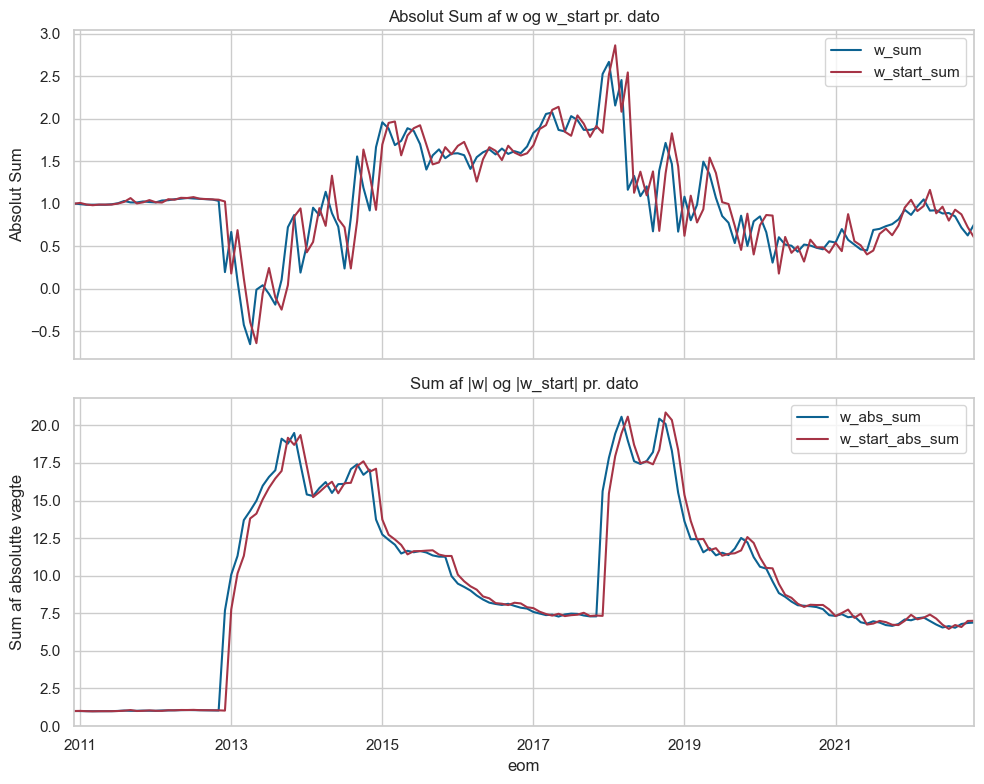

In [26]:
df = tpf_trans_new["w"].copy()

# 1) Gruppér pr. dato (eom) og beregn sum af w, sum af w_start,
#    samt sum af |w| og sum af |w_start|
df_agg = df.groupby("eom").agg({
    "w": ["sum", lambda x: x.abs().sum()],
    "w_start": ["sum", lambda x: x.abs().sum()]
})

# 2) Giv kolonnerne mere sigende navne
df_agg.columns = ["w_sum", "w_abs_sum", "w_start_sum", "w_start_abs_sum"]

# 3) Plot
fig, ax = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

# Plot sum(w) og sum(w_start) i øverste subplot
df_agg[["w_sum", "w_start_sum"]].plot(ax=ax[0])
ax[0].set_title("Absolut Sum af w og w_start pr. dato")
ax[0].set_ylabel("Absolut Sum")

# Plot sum(|w|) og sum(|w_start|) i nederste subplot
df_agg[["w_abs_sum", "w_start_abs_sum"]].plot(ax=ax[1])
ax[1].set_title("Sum af |w| og |w_start| pr. dato")
ax[1].set_ylabel("Sum af absolutte vægte")

plt.tight_layout()
plt.show()


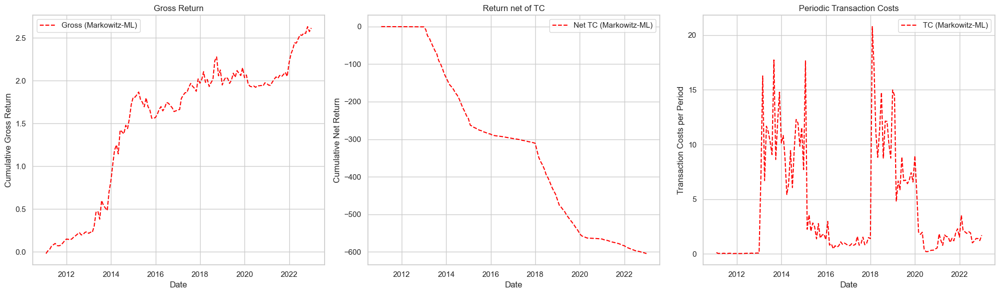

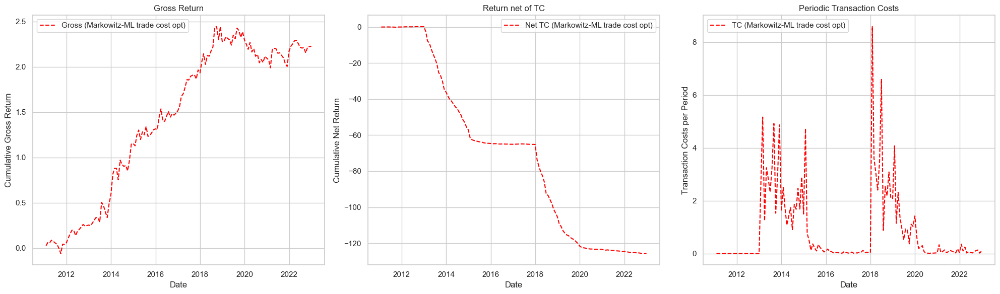

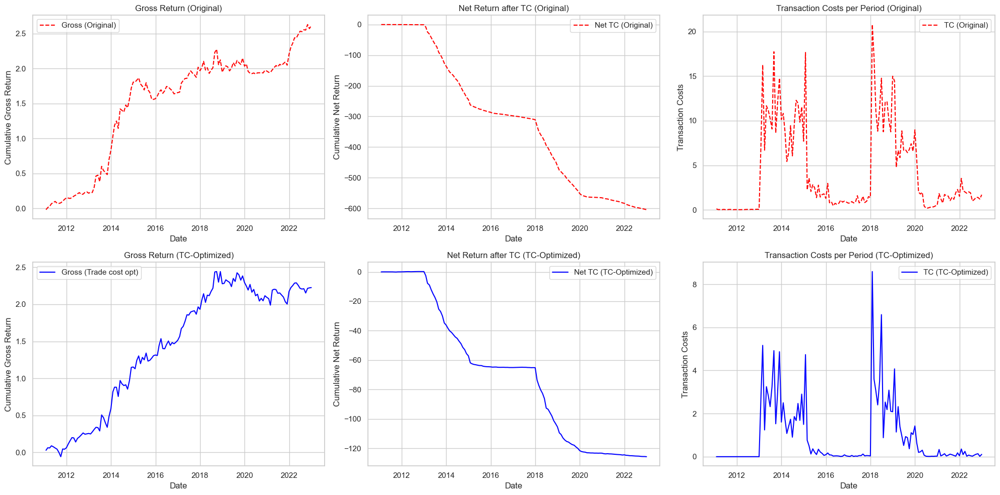

In [27]:
# Kopier dataframe for Markowitz-ML
tpf_data = tpf_original["pf"].copy()

# Beregn kumulative afkast for Markowitz-ML
tpf_data['cumret'] = tpf_data['r'].cumsum()
tpf_data['cumret_tc'] = (tpf_data['r'] - tpf_data['tc']).cumsum()

tpf_data_new = tpf_trans_new["pf"].copy()

# Beregn kumulative afkast for Markowitz-ML
tpf_data_new['cumret'] = tpf_data_new['r'].cumsum()
tpf_data_new['cumret_tc'] = (tpf_data_new['r'] - tpf_data_new['tc']).cumsum()

# Opret 3 subplots: Gross Return, Return net of TC og Periodiske Transaction Costs
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# --- Plot 1: Gross Return ---
ax = axes[0]
ax.plot(tpf_data['eom_ret'], tpf_data['cumret'], label='Gross (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Gross Return')
ax.set_title('Gross Return')
ax.grid(True)
ax.legend()

# --- Plot 2: Return net of TC ---
ax = axes[1]
ax.plot(tpf_data['eom_ret'], tpf_data['cumret_tc'], label='Net TC (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Net Return')
ax.set_title('Return net of TC')
ax.grid(True)
ax.legend()

# --- Plot 3: Periodiske Transaction Costs ---
ax = axes[2]
ax.plot(tpf_data['eom_ret'], tpf_data['tc'], label='TC (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Transaction Costs per Period')
ax.set_title('Periodic Transaction Costs')
ax.grid(True)
ax.legend()

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "markowitz_ml_original.png"), dpi=300, bbox_inches='tight')
plt.show()

# Opret 3 subplots: Gross Return, Return net of TC og Periodiske Transaction Costs
fig, axes = plt.subplots(1, 3, figsize=(20, 6))
# --- Plot 1: Gross Return ---
ax = axes[0]
ax.plot(tpf_data['eom_ret'], tpf_data_new['cumret'], label='Gross (Markowitz-ML trade cost opt)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Gross Return')
ax.set_title('Gross Return')
ax.grid(True)
ax.legend()

# --- Plot 2: Return net of TC ---
ax = axes[1]
ax.plot(tpf_data['eom_ret'], tpf_data_new['cumret_tc'], label='Net TC (Markowitz-ML trade cost opt)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Net Return')
ax.set_title('Return net of TC')
ax.grid(True)
ax.legend()

# --- Plot 3: Periodiske Transaction Costs ---
ax = axes[2]
ax.plot(tpf_data['eom_ret'], tpf_data_new['tc'], label='TC (Markowitz-ML trade cost opt)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Transaction Costs per Period')
ax.set_title('Periodic Transaction Costs')
ax.grid(True)
ax.legend()

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "markowitz_ml_trans_opt.png"), dpi=300, bbox_inches='tight')
plt.show()

# Beregn kumulative afkast for begge
tpf_data = tpf_original["pf"].copy()
tpf_data['cumret'] = tpf_data['r'].cumsum()
tpf_data['cumret_tc'] = (tpf_data['r'] - tpf_data['tc']).cumsum()

tpf_data_new = tpf_trans_new["pf"].copy()
tpf_data_new['cumret'] = tpf_data_new['r'].cumsum()
tpf_data_new['cumret_tc'] = (tpf_data_new['r'] - tpf_data_new['tc']).cumsum()

# Opret samlet plot med 2 rækker (original og trade-cost-opt) og 3 kolonner
fig, axes = plt.subplots(2, 3, figsize=(20, 10))

# --- Øverste række: Original Markowitz-ML ---
axes[0, 0].plot(tpf_data['eom_ret'], tpf_data['cumret'], label='Gross (Original)', color='red', linestyle='--')
axes[0, 0].set_title('Gross Return (Original)')
axes[0, 0].set_xlabel('Date')
axes[0, 0].set_ylabel('Cumulative Gross Return')
axes[0, 0].legend()
axes[0, 0].grid(True)

axes[0, 1].plot(tpf_data['eom_ret'], tpf_data['cumret_tc'], label='Net TC (Original)', color='red', linestyle='--')
axes[0, 1].set_title('Net Return after TC (Original)')
axes[0, 1].set_xlabel('Date')
axes[0, 1].set_ylabel('Cumulative Net Return')
axes[0, 1].legend()
axes[0, 1].grid(True)

axes[0, 2].plot(tpf_data['eom_ret'], tpf_data['tc'], label='TC (Original)', color='red', linestyle='--')
axes[0, 2].set_title('Transaction Costs per Period (Original)')
axes[0, 2].set_xlabel('Date')
axes[0, 2].set_ylabel('Transaction Costs')
axes[0, 2].legend()
axes[0, 2].grid(True)

# --- Nederste række: Trade Cost Optimeret ---
axes[1, 0].plot(tpf_data['eom_ret'], tpf_data_new['cumret'], label='Gross (Trade cost opt)', color='blue', linestyle='-')
axes[1, 0].set_title('Gross Return (TC-Optimized)')
axes[1, 0].set_xlabel('Date')
axes[1, 0].set_ylabel('Cumulative Gross Return')
axes[1, 0].legend()
axes[1, 0].grid(True)

axes[1, 1].plot(tpf_data['eom_ret'], tpf_data_new['cumret_tc'], label='Net TC (TC-Optimized)', color='blue', linestyle='-')
axes[1, 1].set_title('Net Return after TC (TC-Optimized)')
axes[1, 1].set_xlabel('Date')
axes[1, 1].set_ylabel('Cumulative Net Return')
axes[1, 1].legend()
axes[1, 1].grid(True)

axes[1, 2].plot(tpf_data['eom_ret'], tpf_data_new['tc'], label='TC (TC-Optimized)', color='blue', linestyle='-')
axes[1, 2].set_title('Transaction Costs per Period (TC-Optimized)')
axes[1, 2].set_xlabel('Date')
axes[1, 2].set_ylabel('Transaction Costs')
axes[1, 2].legend()
axes[1, 2].grid(True)

# Fælles layout og gem
plt.tight_layout()
plt.savefig(os.path.join(output_folder, "markowitz_ml_trans_opt_combined.png"), dpi=300, bbox_inches='tight')

In [28]:
df_metrics = compare_portfolio_metrics(tpf_original, tpf_trans_new)
display(df_metrics)
latex_table = df_metrics.to_latex(index=False, float_format="%.4f", caption="Sammenligning af porteføljemålepunkter", label="tab:portfolio_metrics")
print(latex_table)
latex_table = df_metrics.set_index("Metric").T.to_latex(
    float_format="%.4f",
    caption="Sammenligning af porteføljemålepunkter (transponeret)",
    label="tab:portfolio_metrics_transposed"
)
print(latex_table)

,Metric,Markowitz-ML,Markowitz-ML TC optimeret
0,r_yearly,0.217868,0.185529
1,std_yearly,0.251235,0.257264
2,SR_gross_yearly,0.867189,0.721162
3,tc_yearly,50.583412,10.666197
4,r_tc_yearly,-50.365544,-10.480668
5,SR_net_yearly,-200.471870,-40.739009
6,inv,10.953368,9.580609
7,Shorting,5.048301,4.256125
8,Turnover,8.776867,2.193233


\begin{table}
\caption{Sammenligning af porteføljemålepunkter}
\label{tab:portfolio_metrics}
\begin{tabular}{lrr}
\toprule
Metric & Markowitz-ML & Markowitz-ML TC optimeret \\
\midrule
r_yearly & 0.2179 & 0.1855 \\
std_yearly & 0.2512 & 0.2573 \\
SR_gross_yearly & 0.8672 & 0.7212 \\
tc_yearly & 50.5834 & 10.6662 \\
r_tc_yearly & -50.3655 & -10.4807 \\
SR_net_yearly & -200.4719 & -40.7390 \\
inv & 10.9534 & 9.5806 \\
Shorting & 5.0483 & 4.2561 \\
Turnover & 8.7769 & 2.1932 \\
\bottomrule
\end{tabular}
\end{table}

\begin{table}
\caption{Sammenligning af porteføljemålepunkter (transponeret)}
\label{tab:portfolio_metrics_transposed}
\begin{tabular}{lrrrrrrrrr}
\toprule
Metric & r_yearly & std_yearly & SR_gross_yearly & tc_yearly & r_tc_yearly & SR_net_yearly & inv & Shorting & Turnover \\
\midrule
Markowitz-ML & 0.2179 & 0.2512 & 0.8672 & 50.5834 & -50.3655 & -200.4719 & 10.9534 & 5.0483 & 8.7769 \\
Markowitz-ML TC optimeret & 0.1855 & 0.2573 & 0.7212 & 10.6662 & -10.4807 & -40.7390 & 9.5

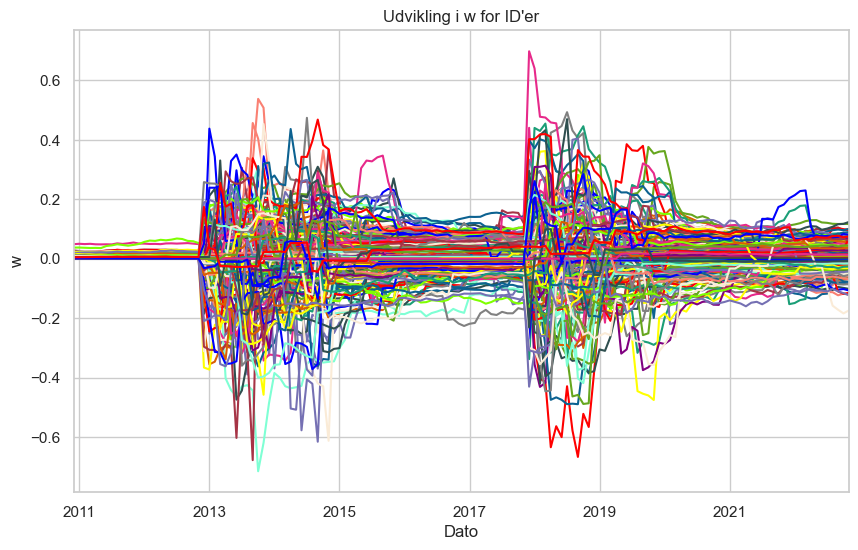

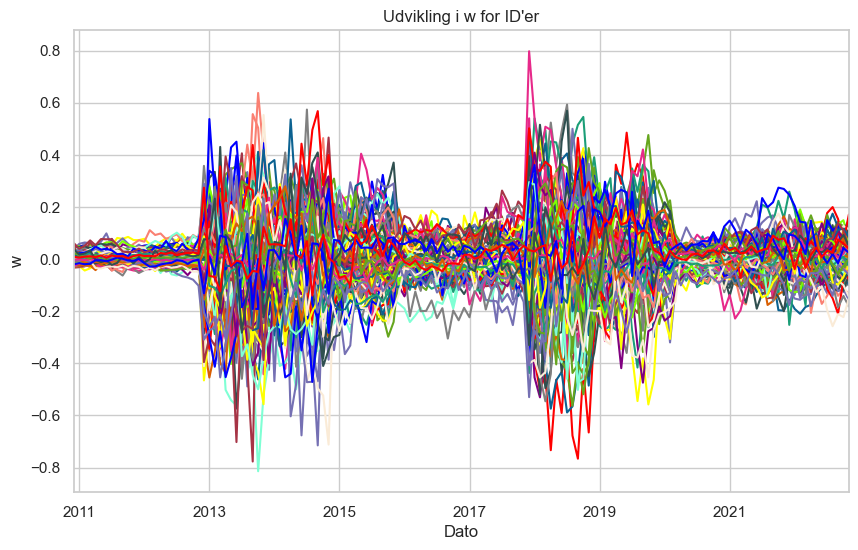

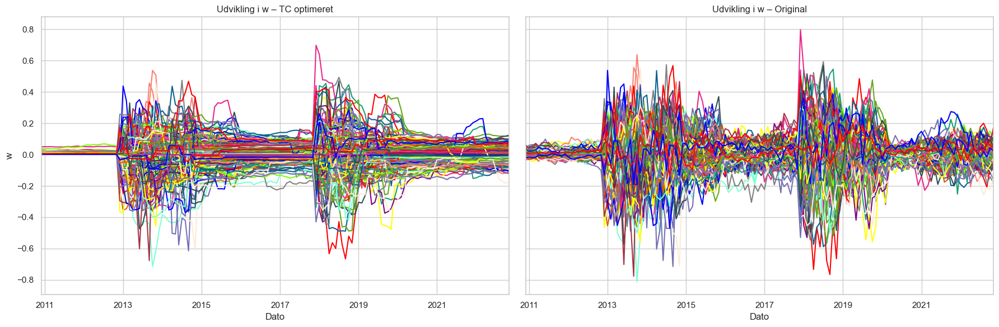

In [29]:
plot_specific_ids(tpf_trans_new["w"], id_list=None, weight_col='w', show_legend=False)
plot_specific_ids(tpf_original["w"], id_list=None, weight_col='w', show_legend=False)

fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

# Plot tpf_trans (optimeret)
plot_specific_ids(tpf_trans_new["w"], id_list=None, weight_col="w", ax=axes[0], show_legend=False)
axes[0].set_title("Udvikling i w – TC optimeret")
axes[0].set_xlabel("Dato")
axes[0].set_ylabel("w")

# Plot tpf_original
plot_specific_ids(tpf_original["w"], id_list=None, weight_col="w", ax=axes[1], show_legend=False)
axes[1].set_title("Udvikling i w – Original")
axes[1].set_xlabel("Dato")

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "w_udvikling_MVO_ML_TC_optimeret"), dpi=300, bbox_inches='tight')
plt.show()


# MVO-ML med TC optimering - lukket løsning

## Denne kode virker, hvis portøljen allerede er indenfor grænsen, så fejler den

In [85]:
import numpy as np
import pandas as pd
from scipy.optimize import brentq
import cvxpy as cp  # Hvis du ellers bruger cvxpy et andet sted
import General_Functions  # Skal indeholde fx: initial_weights_new, create_cov, pf_ts_fun osv.

def solve_closed_form_portfolio(w_start, pi_opt, lambda_vec, delta, tol=1e-8):
    """
    Løser den lukkede optimering:
    
        min_{pi} (pi - w_start)^T Λ (pi - w_start)
        s.t. ||pi - pi_opt||_2^2 = delta^2
    
    Med den ekspl. komponentvise løsning:
    
        pi_i = (lambda_i/(lambda_i + eta)) * w_start_i + (eta/(lambda_i+eta)) * pi_opt_i,
    
    hvor eta findes ved at løse:
    
        sum_i [ (lambda_i/(lambda_i+eta) * (w_start_i - pi_opt_i))^2 ] = delta^2.
    
    Parametre:
        w_start   : Numpy-array med den afkastjusterede portefølje (w_start)
        pi_opt    : Numpy-array med de optimale vægte (pi_opt)
        lambda_vec: Numpy-array med transaktionsomkostningsparametre (diagonale elementer af Λ)
        delta     : Radius δ for den kvadratiske afstand.
        tol       : Tolerance for rodfinding.
        
    Returnerer:
        pi_new    : Numpy-array med de nye porteføljevægte.
        eta       : Den fundne værdi for Lagrange-multiplikatoren.
    """
    def f(eta):
        factors = lambda_vec / (lambda_vec + eta)
        diff = factors * (w_start - pi_opt)
        return np.sum(diff**2) - delta**2

    # Vi forventer, at f(0) > 0, dvs. den ubetingede løsning ligger udenfor delta-kuglen.
    f0 = f(0)
    if f0 < 0:
        raise ValueError("Ubetingede løsning (w_start) er allerede indenfor delta: f(0) < 0.")

    eta_solution = brentq(f, a=1e-8, b=1e8, xtol=tol)
    factors = lambda_vec / (lambda_vec + eta_solution)
    pi_new = factors * w_start + (eta_solution / (lambda_vec + eta_solution)) * pi_opt

    return pi_new, eta_solution


def tpf_implement_closed_form(data, cov_list, wealth, dates, gam, delta):
    """
    Udregner porteføljevægtene dato-for-dato ved at bruge den lukkede løsning.
    
    Her beregnes:
      - Et optimalt udgangspunkt pi_opt (fx udregnet med Markowitz-formlen), og
      - Den forrige periodes vægte w_start (afkastjusteret via adjust_w_prev_for_returns).
    
    Porteføljen opdateres via:
        pi_new = (lambda_vec/(lambda_vec + eta)) * w_start + (eta/(lambda_vec+eta)) * pi_opt,
    hvor eta findes numerisk så:
        || (lambda_vec/(lambda_vec+eta)) * (w_start - pi_opt) ||^2 = delta^2.
    
    Parametre:
      data    : DataFrame med aktiedata (skal indeholde 'id', 'eom', 'tr_ld1', 'pred_ld1' og evt. 'lambda')
      cov_list: Dictionary med kovariansmatricer (nøgle: dato)
      wealth  : DataFrame med wealth-data (fx 'eom' og 'mu_ld1')
      dates   : Liste af datoer
      gam     : Risikoparameter
      delta   : Afstandskonstant for constrainten: ||pi - pi_opt||^2 = delta^2.
      
    Returnerer:
      tpf_opt : DataFrame med kolonnerne ['id', 'eom', 'w'] for hver dato.
    """
    # Filter og sorter data
    data_rel = data[(data['valid'] == True) & (data['eom'].isin(dates))][['id','eom','me','tr_ld1','pred_ld1']]
    data_rel = data_rel.sort_values(by=['id','eom'])
    data_split = {d: df for d, df in data_rel.groupby('eom')}
    
    # Helper-funktion til afkastjustering af w_prev
    def adjust_w_prev_for_returns(w_prev_series, df_current, wealth_current):
        df_current = df_current.set_index('id')
        w_prev_aligned = w_prev_series.reindex(df_current.index).fillna(0)
        tr_ld1 = df_current['tr_ld1']
        mu_ld1 = wealth_current['mu_ld1'].iloc[0]  # antager én værdi pr. dato
        return w_prev_aligned * (1 + tr_ld1) / (1 + mu_ld1)
    
    tpf_opt_list = []
    
    # For den første dato: brug initiale VW-vægte
    first_date = dates[0]
    data_first = data_split[first_date]
    init_w = General_Functions.initial_weights_new(data_first, w_type="vw")
    w_prev_series = pd.Series(init_w['w_start'].values, index=init_w['id'])
    
    for d in dates:
        data_sub = data_split.get(d)
        if data_sub is None or data_sub.empty:
            continue

        # Udregn pi_opt med fx Markowitz-metoden:
        ids = data_sub['id'].tolist()
        d_key = d.strftime('%Y-%m-%d') if isinstance(d, pd.Timestamp) else d
        sigma = General_Functions.create_cov(cov_list[d_key], ids=ids)
        pred_vector = data_sub['pred_ld1'].values
        pi_opt = (1 / gam) * np.linalg.solve(sigma, pred_vector)
        
        # Brug lambda-vektoren fra data_sub (hvis tilgængelig) eller sæt til 1 for alle aktiver:
        lambda_vec = data_sub['lambda'].values if 'lambda' in data_sub.columns else np.ones_like(pi_opt)
        
        # Justér w_prev_series for afkast til at få w_start
        wealth_d = wealth.loc[wealth['eom'] == d]
        w_start = adjust_w_prev_for_returns(w_prev_series, data_sub, wealth_d).values
        
        # Kaldes den lukkede løsning (bruger w_start direkte i stedet for g*pi_prev):
        try:
            pi_new, eta = solve_closed_form_portfolio(w_start, pi_opt, lambda_vec, delta)
        except ValueError as e:
            print(f"Fejl ved dato {d}: {e}")
            continue
        
        # Gem resultat for denne dato:
        temp_df = data_sub[['id', 'eom']].copy()
        temp_df['w'] = pi_new
        tpf_opt_list.append(temp_df)
        
        # Opdater w_prev_series til næste iteration:
        w_prev_series = pd.Series(pi_new, index=data_sub['id'])
    
    if tpf_opt_list:
        tpf_opt = pd.concat(tpf_opt_list, ignore_index=True)
    else:
        tpf_opt = pd.DataFrame(columns=['id','eom','w'])
    
    return tpf_opt

def run_markowitz_closed_form_pipeline(data, cov_list, wealth, dates, gam, delta):
    # 1) Beregn porteføljevægte dato-for-dato med den lukkede løsning
    tpf_opt = tpf_implement_closed_form(data, cov_list, wealth, dates, gam, delta)
    
    # 2) Efterbehandling via w-funktionen (hvis nødvendigt)
    tpf_w = w_fun_qpstyle(tpf_opt, data, wealth, dates)
    
    # 3) Beregn porteføljestatistikker
    tpf_pf = General_Functions.pf_ts_fun(tpf_w, data, wealth, gam)
    
    return {
        "w": tpf_w,
        "pf": tpf_pf
    }

# Eksempel på pipeline-kald:
tpf_trans_closed = run_markowitz_closed_form_pipeline(
    data=chars,
    cov_list=barra_cov,
    wealth=wealth,
    dates=dates_oos,
    gam=pf_set["gamma_rel"],
    delta=0.2  # Sæt delta efter behov
)

print("Optimerede vægte med lukket løsning:")
print(tpf_trans_closed["w"].head())
print("\nPorteføljestatistikker:")
print(tpf_trans_closed["pf"].head())


Fejl ved dato 2011-08-31 00:00:00: Ubetingede løsning (w_start) er allerede indenfor delta: f(0) < 0.
Fejl ved dato 2011-10-31 00:00:00: Ubetingede løsning (w_start) er allerede indenfor delta: f(0) < 0.
Fejl ved dato 2011-11-30 00:00:00: Ubetingede løsning (w_start) er allerede indenfor delta: f(0) < 0.
Fejl ved dato 2011-12-31 00:00:00: Ubetingede løsning (w_start) er allerede indenfor delta: f(0) < 0.
Fejl ved dato 2012-08-31 00:00:00: Ubetingede løsning (w_start) er allerede indenfor delta: f(0) < 0.
Fejl ved dato 2012-10-31 00:00:00: Ubetingede løsning (w_start) er allerede indenfor delta: f(0) < 0.
Optimerede vægte med lukket løsning:
      id        eom   w_start         w  tr_ld1  mu_ld1
0  10104 2010-12-31  0.019620  0.018649     NaN     NaN
1  10107 2010-12-31  0.029097  0.012802     NaN     NaN
2  10138 2010-12-31  0.002072  0.001741     NaN     NaN
3  10696 2010-12-31  0.001067  0.004467     NaN     NaN
4  11308 2010-12-31  0.018948  0.014508     NaN     NaN

Porteføljestat

## Denne kode fungerer, hvis den porteføljen allerede er indenfor grænsen, så beholdes w_start_g_t (som er det vi ønsker)

In [115]:
import numpy as np
import pandas as pd
from scipy.optimize import brentq
import cvxpy as cp  # Hvis du ellers bruger cvxpy et andet sted
import General_Functions  # Skal indeholde fx: initial_weights_new, create_cov, pf_ts_fun osv.

def solve_closed_form_portfolio(w_start, pi_opt, lambda_vec, delta, tol=1e-8):
    """
    Løser den lukkede optimering:
    
        min_{pi} (pi - w_start)^T Λ (pi - w_start)
        s.t. ||pi - pi_opt||_2^2 = delta^2
    
    Med den ekspl. komponentvise løsning:
    
        pi_i = (lambda_i/(lambda_i + eta)) * w_start_i + (eta/(lambda_i+eta)) * pi_opt_i,
    
    hvor eta findes ved at løse:
    
        sum_i [ (lambda_i/(lambda_i+eta) * (w_start_i - pi_opt_i))^2 ] = delta^2.
    
    Parametre:
        w_start   : Numpy-array med den afkastjusterede portefølje (w_start)
        pi_opt    : Numpy-array med de optimale vægte (pi_opt)
        lambda_vec: Numpy-array med transaktionsomkostningsparametre (diagonale elementer af Λ)
        delta     : Radius δ for den kvadratiske afstand.
        tol       : Tolerance for rodfinding.
        
    Returnerer:
        pi_new    : Numpy-array med de nye porteføljevægte.
        eta       : Den fundne værdi for Lagrange-multiplikatoren.
    """
    def f(eta):
        factors = lambda_vec / (lambda_vec + eta)
        diff = factors * (w_start - pi_opt)
        return np.sum(diff**2) - delta**2

    # Vi forventer, at f(0) > 0, dvs. den ubetingede løsning ligger udenfor delta-kuglen.
    f0 = f(0)
    if f0 < 0:
        return w_start, 0.0

    eta_solution = brentq(f, a=1e-8, b=1e8, xtol=tol)
    factors = lambda_vec / (lambda_vec + eta_solution)
    pi_new = factors * w_start + (eta_solution / (lambda_vec + eta_solution)) * pi_opt

    return pi_new, eta_solution


def tpf_implement_closed_form(data, cov_list, wealth, dates, gam, delta):
    """
    Udregner porteføljevægtene dato-for-dato ved at bruge den lukkede løsning.
    
    Her beregnes:
      - Et optimalt udgangspunkt pi_opt (fx udregnet med Markowitz-formlen), og
      - Den forrige periodes vægte w_start (afkastjusteret via adjust_w_prev_for_returns).
    
    Porteføljen opdateres via:
        pi_new = (lambda_vec/(lambda_vec + eta)) * w_start + (eta/(lambda_vec+eta)) * pi_opt,
    hvor eta findes numerisk så:
        || (lambda_vec/(lambda_vec+eta)) * (w_start - pi_opt) ||^2 = delta^2.
    
    Parametre:
      data    : DataFrame med aktiedata (skal indeholde 'id', 'eom', 'tr_ld1', 'pred_ld1' og evt. 'lambda')
      cov_list: Dictionary med kovariansmatricer (nøgle: dato)
      wealth  : DataFrame med wealth-data (fx 'eom' og 'mu_ld1')
      dates   : Liste af datoer
      gam     : Risikoparameter
      delta   : Afstandskonstant for constrainten: ||pi - pi_opt||^2 = delta^2.
      
    Returnerer:
      tpf_opt : DataFrame med kolonnerne ['id', 'eom', 'w'] for hver dato.
    """
    # Filter og sorter data
    data_rel = data[(data['valid'] == True) & (data['eom'].isin(dates))][['id','eom','me','tr_ld1','pred_ld1']]
    data_rel = data_rel.sort_values(by=['id','eom'])
    data_split = {d: df for d, df in data_rel.groupby('eom')}
    
    # Helper-funktion til afkastjustering af w_prev
    def adjust_w_prev_for_returns(w_prev_series, df_current, wealth_current):
        df_current = df_current.set_index('id')
        w_prev_aligned = w_prev_series.reindex(df_current.index).fillna(0)
        tr_ld1 = df_current['tr_ld1']
        mu_ld1 = wealth_current['mu_ld1'].iloc[0]  # antager én værdi pr. dato
        return w_prev_aligned * (1 + tr_ld1) / (1 + mu_ld1)
    
    tpf_opt_list = []
    
    # For den første dato: brug initiale VW-vægte
    first_date = dates[0]
    data_first = data_split[first_date]
    init_w = General_Functions.initial_weights_new(data_first, w_type="vw")
    w_prev_series = pd.Series(init_w['w_start'].values, index=init_w['id'])
    
    for d in dates:
        data_sub = data_split.get(d)
        if data_sub is None or data_sub.empty:
            continue

        # Udregn pi_opt med fx Markowitz-metoden:
        ids = data_sub['id'].tolist()
        d_key = d.strftime('%Y-%m-%d') if isinstance(d, pd.Timestamp) else d
        sigma = General_Functions.create_cov(cov_list[d_key], ids=ids)
        pred_vector = data_sub['pred_ld1'].values
        pi_opt = (1 / gam) * np.linalg.solve(sigma, pred_vector)
        
        # Brug lambda-vektoren fra data_sub (hvis tilgængelig) eller sæt til 1 for alle aktiver:
        lambda_vec = data_sub['lambda'].values if 'lambda' in data_sub.columns else np.ones_like(pi_opt)
        
        # Justér w_prev_series for afkast til at få w_start
        wealth_d = wealth.loc[wealth['eom'] == d]
        w_start = adjust_w_prev_for_returns(w_prev_series, data_sub, wealth_d).values
        
        # Kaldes den lukkede løsning (bruger w_start direkte i stedet for g*pi_prev):
        try:
            pi_new, eta = solve_closed_form_portfolio(w_start, pi_opt, lambda_vec, delta)
        except ValueError as e:
            print(f"Fejl ved dato {d}: {e}")
            continue
        
        # Gem resultat for denne dato:
        temp_df = data_sub[['id', 'eom']].copy()
        temp_df['w'] = pi_new
        tpf_opt_list.append(temp_df)
        
        # Opdater w_prev_series til næste iteration:
        w_prev_series = pd.Series(pi_new, index=data_sub['id'])
    
    if tpf_opt_list:
        tpf_opt = pd.concat(tpf_opt_list, ignore_index=True)
    else:
        tpf_opt = pd.DataFrame(columns=['id','eom','w'])
    
    return tpf_opt

def run_markowitz_closed_form_pipeline(data, cov_list, wealth, dates, gam, delta):
    # 1) Beregn porteføljevægte dato-for-dato med den lukkede løsning
    tpf_opt = tpf_implement_closed_form(data, cov_list, wealth, dates, gam, delta)
    
    # 2) Efterbehandling via w-funktionen (hvis nødvendigt)
    tpf_w = w_fun_qpstyle(tpf_opt, data, wealth, dates)
    
    # 3) Beregn porteføljestatistikker
    tpf_pf = General_Functions.pf_ts_fun(tpf_w, data, wealth, gam)
    
    return {
        "w": tpf_w,
        "pf": tpf_pf
    }

# Eksempel på pipeline-kald:
tpf_trans_closed = run_markowitz_closed_form_pipeline(
    data=chars,
    cov_list=barra_cov,
    wealth=wealth,
    dates=dates_oos,
    gam=pf_set["gamma_rel"],
    delta=0.8  # Sæt delta efter behov
)

print("Optimerede vægte med lukket løsning:")
print(tpf_trans_closed["w"].head())
print("\nPorteføljestatistikker:")
print(tpf_trans_closed["pf"].head())


Optimerede vægte med lukket løsning:
      id        eom   w_start         w  tr_ld1  mu_ld1
0  10104 2010-12-31  0.019620  0.019714     NaN     NaN
1  10107 2010-12-31  0.029097  0.028337     NaN     NaN
2  10138 2010-12-31  0.002072  0.002075     NaN     NaN
3  10696 2010-12-31  0.001067  0.001104     NaN     NaN
4  11308 2010-12-31  0.018948  0.017751     NaN     NaN

Porteføljestatistikker:
        inv  shorting  turnover         r        tc    eom_ret
0  1.003351       0.0  0.044995  0.027027  0.000020 2011-01-31
1  0.995887       0.0  0.056645  0.033514  0.000031 2011-02-28
2  0.988555       0.0  0.047012 -0.002288  0.000033 2011-03-31
3  0.988242       0.0  0.044335  0.029241  0.000020 2011-04-30
4  0.988051       0.0  0.041375 -0.013311  0.000017 2011-05-31


In [116]:
df_metrics = compare_portfolio_metrics(tpf_original, tpf_trans_closed)
display(df_metrics)
latex_table = df_metrics.to_latex(index=False, float_format="%.4f", caption="Sammenligning af porteføljemålepunkter", label="tab:portfolio_metrics")
print(latex_table)
latex_table = df_metrics.set_index("Metric").T.to_latex(
    float_format="%.4f",
    caption="Sammenligning af porteføljemålepunkter (transponeret)",
    label="tab:portfolio_metrics_transposed"
)
print(latex_table)

,Metric,Markowitz-ML,Markowitz-ML TC optimeret
0,r_yearly,0.217868,0.183081
1,std_yearly,0.251235,0.246541
2,SR_gross_yearly,0.867189,0.742598
3,tc_yearly,50.583412,8.744446
4,r_tc_yearly,-50.365544,-8.561365
5,SR_net_yearly,-200.471870,-34.725917
6,inv,10.953368,9.670711
7,Shorting,5.048301,4.363866
8,Turnover,8.776867,2.853433


\begin{table}
\caption{Sammenligning af porteføljemålepunkter}
\label{tab:portfolio_metrics}
\begin{tabular}{lrr}
\toprule
Metric & Markowitz-ML & Markowitz-ML TC optimeret \\
\midrule
r_yearly & 0.2179 & 0.1831 \\
std_yearly & 0.2512 & 0.2465 \\
SR_gross_yearly & 0.8672 & 0.7426 \\
tc_yearly & 50.5834 & 8.7444 \\
r_tc_yearly & -50.3655 & -8.5614 \\
SR_net_yearly & -200.4719 & -34.7259 \\
inv & 10.9534 & 9.6707 \\
Shorting & 5.0483 & 4.3639 \\
Turnover & 8.7769 & 2.8534 \\
\bottomrule
\end{tabular}
\end{table}

\begin{table}
\caption{Sammenligning af porteføljemålepunkter (transponeret)}
\label{tab:portfolio_metrics_transposed}
\begin{tabular}{lrrrrrrrrr}
\toprule
Metric & r_yearly & std_yearly & SR_gross_yearly & tc_yearly & r_tc_yearly & SR_net_yearly & inv & Shorting & Turnover \\
\midrule
Markowitz-ML & 0.2179 & 0.2512 & 0.8672 & 50.5834 & -50.3655 & -200.4719 & 10.9534 & 5.0483 & 8.7769 \\
Markowitz-ML TC optimeret & 0.1831 & 0.2465 & 0.7426 & 8.7444 & -8.5614 & -34.7259 & 9.6707 

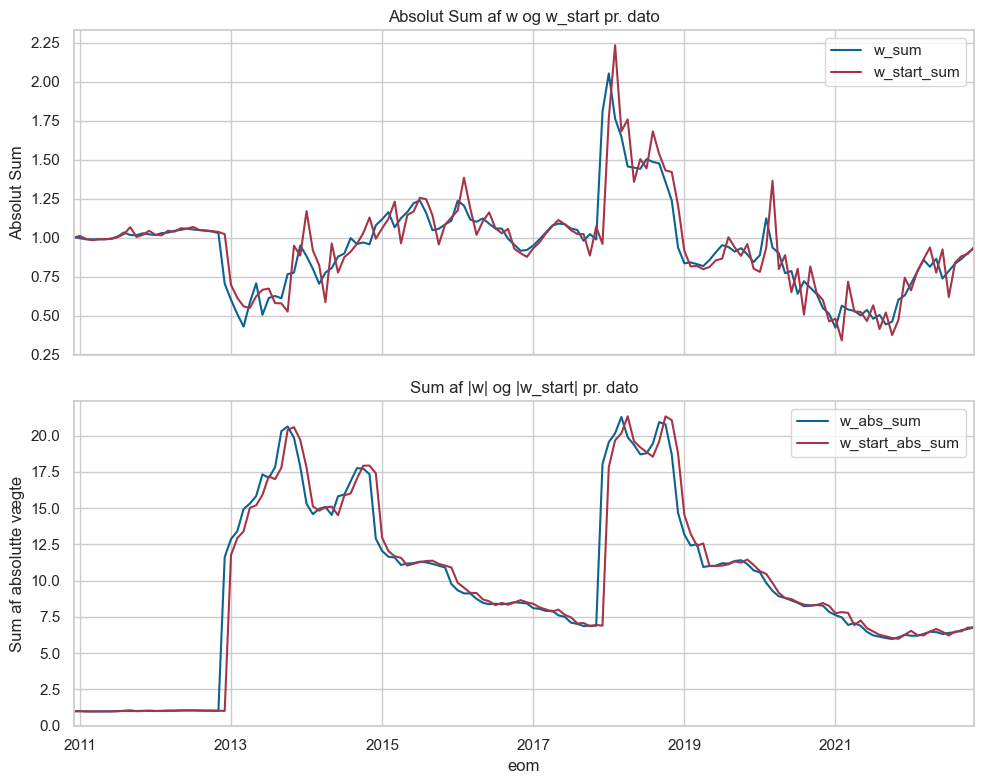

In [117]:
df = tpf_trans_closed["w"].copy()

# 1) Gruppér pr. dato (eom) og beregn sum af w, sum af w_start,
#    samt sum af |w| og sum af |w_start|
df_agg = df.groupby("eom").agg({
    "w": ["sum", lambda x: x.abs().sum()],
    "w_start": ["sum", lambda x: x.abs().sum()]
})

# 2) Giv kolonnerne mere sigende navne
df_agg.columns = ["w_sum", "w_abs_sum", "w_start_sum", "w_start_abs_sum"]

# 3) Plot
fig, ax = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

# Plot sum(w) og sum(w_start) i øverste subplot
df_agg[["w_sum", "w_start_sum"]].plot(ax=ax[0])
ax[0].set_title("Absolut Sum af w og w_start pr. dato")
ax[0].set_ylabel("Absolut Sum")

# Plot sum(|w|) og sum(|w_start|) i nederste subplot
df_agg[["w_abs_sum", "w_start_abs_sum"]].plot(ax=ax[1])
ax[1].set_title("Sum af |w| og |w_start| pr. dato")
ax[1].set_ylabel("Sum af absolutte vægte")

plt.tight_layout()
plt.show()


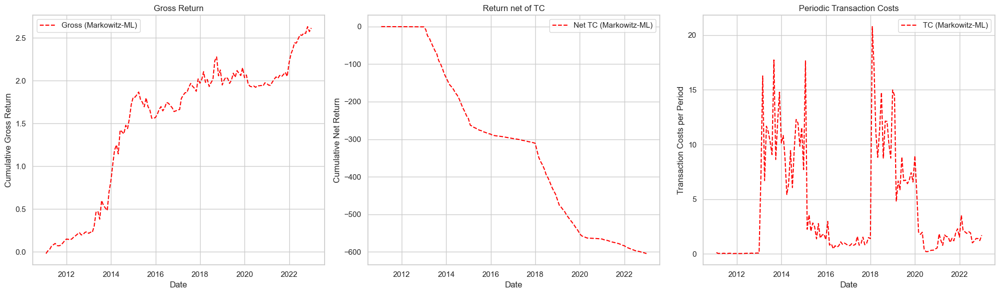

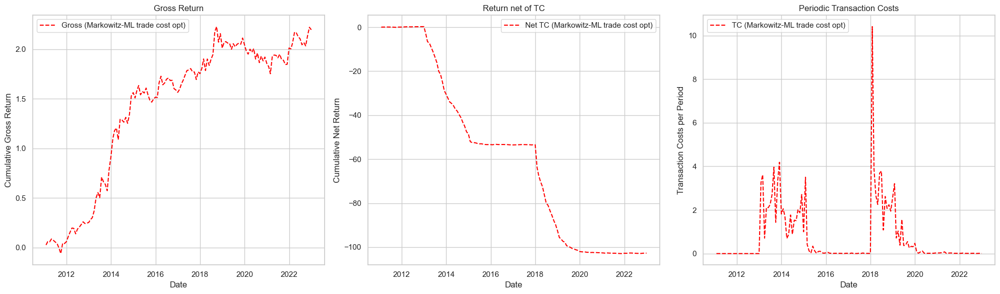

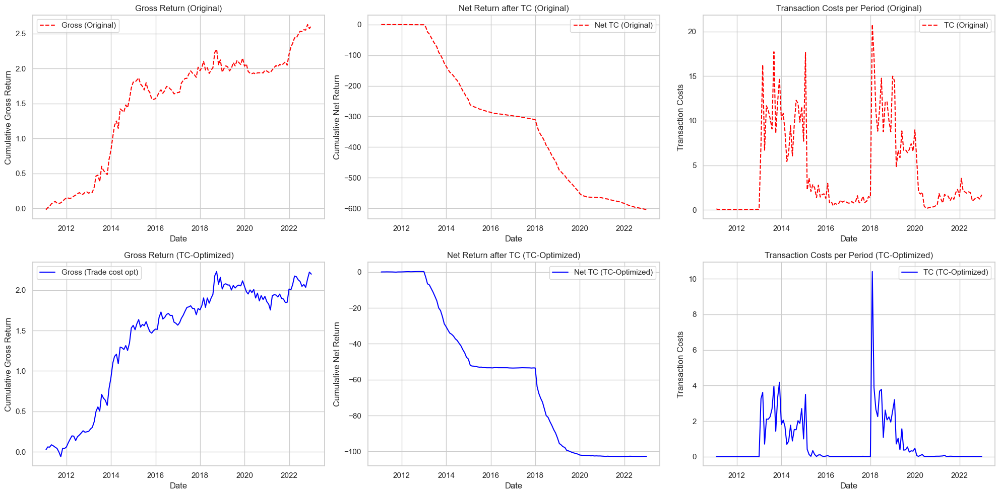

In [118]:
# Kopier dataframe for Markowitz-ML
tpf_data = tpf_original["pf"].copy()

# Beregn kumulative afkast for Markowitz-ML
tpf_data['cumret'] = tpf_data['r'].cumsum()
tpf_data['cumret_tc'] = (tpf_data['r'] - tpf_data['tc']).cumsum()

tpf_data_new = tpf_trans_closed["pf"].copy()

# Beregn kumulative afkast for Markowitz-ML
tpf_data_new['cumret'] = tpf_data_new['r'].cumsum()
tpf_data_new['cumret_tc'] = (tpf_data_new['r'] - tpf_data_new['tc']).cumsum()

# Opret 3 subplots: Gross Return, Return net of TC og Periodiske Transaction Costs
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# --- Plot 1: Gross Return ---
ax = axes[0]
ax.plot(tpf_data['eom_ret'], tpf_data['cumret'], label='Gross (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Gross Return')
ax.set_title('Gross Return')
ax.grid(True)
ax.legend()

# --- Plot 2: Return net of TC ---
ax = axes[1]
ax.plot(tpf_data['eom_ret'], tpf_data['cumret_tc'], label='Net TC (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Net Return')
ax.set_title('Return net of TC')
ax.grid(True)
ax.legend()

# --- Plot 3: Periodiske Transaction Costs ---
ax = axes[2]
ax.plot(tpf_data['eom_ret'], tpf_data['tc'], label='TC (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Transaction Costs per Period')
ax.set_title('Periodic Transaction Costs')
ax.grid(True)
ax.legend()

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "markowitz_ml_original.png"), dpi=300, bbox_inches='tight')
plt.show()

# Opret 3 subplots: Gross Return, Return net of TC og Periodiske Transaction Costs
fig, axes = plt.subplots(1, 3, figsize=(20, 6))
# --- Plot 1: Gross Return ---
ax = axes[0]
ax.plot(tpf_data['eom_ret'], tpf_data_new['cumret'], label='Gross (Markowitz-ML trade cost opt)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Gross Return')
ax.set_title('Gross Return')
ax.grid(True)
ax.legend()

# --- Plot 2: Return net of TC ---
ax = axes[1]
ax.plot(tpf_data['eom_ret'], tpf_data_new['cumret_tc'], label='Net TC (Markowitz-ML trade cost opt)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Net Return')
ax.set_title('Return net of TC')
ax.grid(True)
ax.legend()

# --- Plot 3: Periodiske Transaction Costs ---
ax = axes[2]
ax.plot(tpf_data['eom_ret'], tpf_data_new['tc'], label='TC (Markowitz-ML trade cost opt)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Transaction Costs per Period')
ax.set_title('Periodic Transaction Costs')
ax.grid(True)
ax.legend()

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "markowitz_ml_trans_opt.png"), dpi=300, bbox_inches='tight')
plt.show()

# Beregn kumulative afkast for begge
tpf_data = tpf_original["pf"].copy()
tpf_data['cumret'] = tpf_data['r'].cumsum()
tpf_data['cumret_tc'] = (tpf_data['r'] - tpf_data['tc']).cumsum()

tpf_data_new = tpf_trans_closed["pf"].copy()
tpf_data_new['cumret'] = tpf_data_new['r'].cumsum()
tpf_data_new['cumret_tc'] = (tpf_data_new['r'] - tpf_data_new['tc']).cumsum()

# Opret samlet plot med 2 rækker (original og trade-cost-opt) og 3 kolonner
fig, axes = plt.subplots(2, 3, figsize=(20, 10))

# --- Øverste række: Original Markowitz-ML ---
axes[0, 0].plot(tpf_data['eom_ret'], tpf_data['cumret'], label='Gross (Original)', color='red', linestyle='--')
axes[0, 0].set_title('Gross Return (Original)')
axes[0, 0].set_xlabel('Date')
axes[0, 0].set_ylabel('Cumulative Gross Return')
axes[0, 0].legend()
axes[0, 0].grid(True)

axes[0, 1].plot(tpf_data['eom_ret'], tpf_data['cumret_tc'], label='Net TC (Original)', color='red', linestyle='--')
axes[0, 1].set_title('Net Return after TC (Original)')
axes[0, 1].set_xlabel('Date')
axes[0, 1].set_ylabel('Cumulative Net Return')
axes[0, 1].legend()
axes[0, 1].grid(True)

axes[0, 2].plot(tpf_data['eom_ret'], tpf_data['tc'], label='TC (Original)', color='red', linestyle='--')
axes[0, 2].set_title('Transaction Costs per Period (Original)')
axes[0, 2].set_xlabel('Date')
axes[0, 2].set_ylabel('Transaction Costs')
axes[0, 2].legend()
axes[0, 2].grid(True)

# --- Nederste række: Trade Cost Optimeret ---
axes[1, 0].plot(tpf_data['eom_ret'], tpf_data_new['cumret'], label='Gross (Trade cost opt)', color='blue', linestyle='-')
axes[1, 0].set_title('Gross Return (TC-Optimized)')
axes[1, 0].set_xlabel('Date')
axes[1, 0].set_ylabel('Cumulative Gross Return')
axes[1, 0].legend()
axes[1, 0].grid(True)

axes[1, 1].plot(tpf_data['eom_ret'], tpf_data_new['cumret_tc'], label='Net TC (TC-Optimized)', color='blue', linestyle='-')
axes[1, 1].set_title('Net Return after TC (TC-Optimized)')
axes[1, 1].set_xlabel('Date')
axes[1, 1].set_ylabel('Cumulative Net Return')
axes[1, 1].legend()
axes[1, 1].grid(True)

axes[1, 2].plot(tpf_data['eom_ret'], tpf_data_new['tc'], label='TC (TC-Optimized)', color='blue', linestyle='-')
axes[1, 2].set_title('Transaction Costs per Period (TC-Optimized)')
axes[1, 2].set_xlabel('Date')
axes[1, 2].set_ylabel('Transaction Costs')
axes[1, 2].legend()
axes[1, 2].grid(True)

# Fælles layout og gem
plt.tight_layout()
plt.savefig(os.path.join(output_folder, "markowitz_ml_trans_opt_combined.png"), dpi=300, bbox_inches='tight')

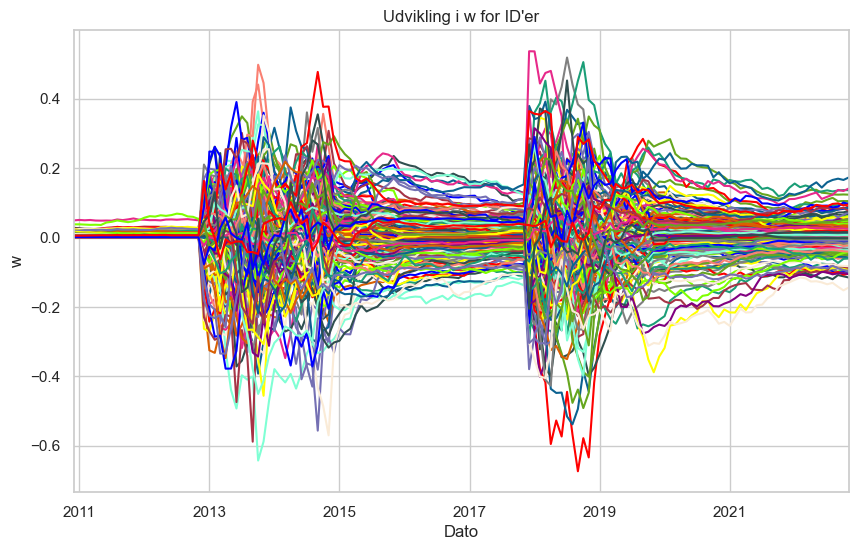

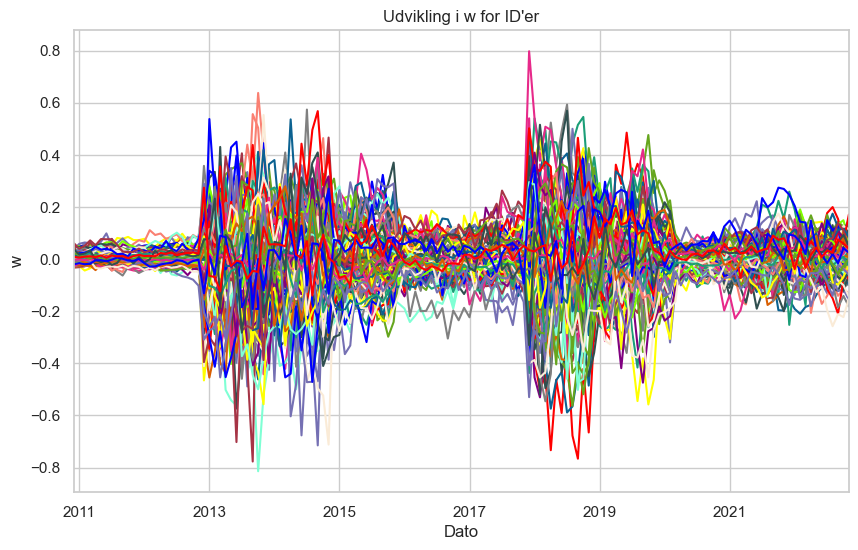

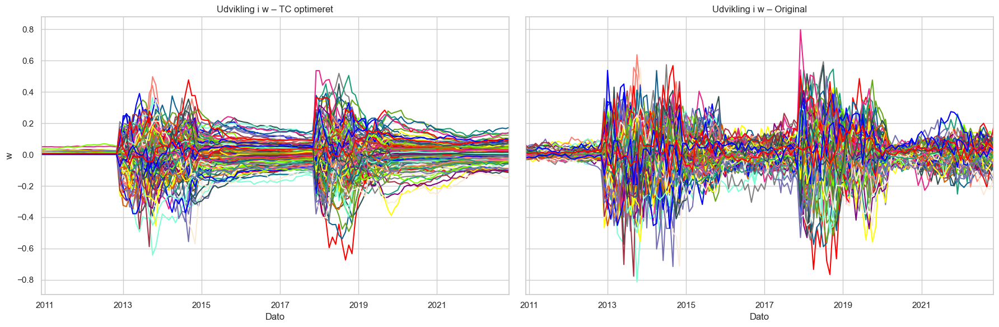

In [119]:
plot_specific_ids(tpf_trans_closed["w"], id_list=None, weight_col='w', show_legend=False)
plot_specific_ids(tpf_original["w"], id_list=None, weight_col='w', show_legend=False)

fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

# Plot tpf_trans (optimeret)
plot_specific_ids(tpf_trans_closed["w"], id_list=None, weight_col="w", ax=axes[0], show_legend=False)
axes[0].set_title("Udvikling i w – TC optimeret")
axes[0].set_xlabel("Dato")
axes[0].set_ylabel("w")

# Plot tpf_original
plot_specific_ids(tpf_original["w"], id_list=None, weight_col="w", ax=axes[1], show_legend=False)
axes[1].set_title("Udvikling i w – Original")
axes[1].set_xlabel("Dato")

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "w_udvikling_MVO_ML_TC_optimeret"), dpi=300, bbox_inches='tight')
plt.show()


## Denne fungerer, hvor bibetingelsen altid er aktiv

In [132]:
def solve_closed_form_portfolio_forced(w_start, pi_opt, lambda_vec, delta, tol=1e-8):
    """
    Løser den lukkede optimering:
    
        min_{pi} (pi - w_start)^T Λ (pi - w_start)
        s.t. ||pi - pi_opt||_2^2 = delta^2
    
    Med den ekspl. komponentvise løsning:
    
        pi_i = (lambda_i/(lambda_i + eta)) * w_start_i + (eta/(lambda_i+eta)) * pi_opt_i,
    
    hvor vi nu tvinger constrainten aktiv, selvom den ubetingede løsning ligger inden for grænsen.
    Dette opnås ved at lede efter en negativ eta, dvs. eta ∈ [ -min(lambda_vec)+eps, 0 ].
    
    Parametre:
        w_start   : Numpy-array med den afkastjusterede portefølje (w_start)
        pi_opt    : Numpy-array med de optimale vægte (pi_opt)
        lambda_vec: Numpy-array med transaktionsomkostningsparametre (diagonale elementer af Λ)
        delta     : Radius δ for den kvadratiske afstand
        tol       : Tolerance for rodfinding
        
    Returnerer:
        pi_new    : Numpy-array med de nye porteføljevægte
        eta       : Den fundne Lagrange-multiplikator
    """
    from scipy.optimize import brentq

    def f(eta):
        # Beregn differencen, vægtet med factors = lambda_vec/(lambda_vec + eta)
        factors = lambda_vec / (lambda_vec + eta)
        diff = factors * (w_start - pi_opt)
        return np.sum(diff**2) - delta**2

    # Hvis den ubetingede løsning allerede er inden for grænsen, dvs. f(0) < 0
    # vil vi nu søge efter en løsning med eta < 0, således at f(eta)=0.
    if f(0) < 0:
        # Sæt nedre grænse = -min(lambda_vec) + lidt offset, så vi undgår division med 0.
        eta_lower = -np.min(lambda_vec) + 1e-8
        eta_upper = 0.0
        eta_solution = brentq(f, a=eta_lower, b=eta_upper, xtol=tol)
    else:
        # Hvis løsningen allerede er uden for grænsen (f(0) >= 0), søg efter positiv eta
        eta_lower = 0.0
        eta_upper = 1.0
        while f(eta_upper) > 0:
            eta_upper *= 2.0
        eta_solution = brentq(f, a=eta_lower, b=eta_upper, xtol=tol)

    factors = lambda_vec / (lambda_vec + eta_solution)
    pi_new = factors * w_start + (eta_solution / (lambda_vec + eta_solution)) * pi_opt
    return pi_new, eta_solution



def tpf_implement_closed_form(data, cov_list, wealth, dates, gam, delta):
    """
    Udregner porteføljevægtene dato-for-dato ved at bruge den lukkede løsning.
    
    Her beregnes:
      - Et optimalt udgangspunkt pi_opt (fx udregnet med Markowitz-formlen), og
      - Den forrige periodes vægte w_start (afkastjusteret via adjust_w_prev_for_returns).
    
    Porteføljen opdateres via:
        pi_new = (lambda_vec/(lambda_vec + eta)) * w_start + (eta/(lambda_vec+eta)) * pi_opt,
    hvor eta findes numerisk så:
        || (lambda_vec/(lambda_vec+eta)) * (w_start - pi_opt) ||^2 = delta^2.
    
    Parametre:
      data    : DataFrame med aktiedata (skal indeholde 'id', 'eom', 'tr_ld1', 'pred_ld1' og evt. 'lambda')
      cov_list: Dictionary med kovariansmatricer (nøgle: dato)
      wealth  : DataFrame med wealth-data (fx 'eom' og 'mu_ld1')
      dates   : Liste af datoer
      gam     : Risikoparameter
      delta   : Afstandskonstant for constrainten: ||pi - pi_opt||^2 = delta^2.
      
    Returnerer:
      tpf_opt : DataFrame med kolonnerne ['id', 'eom', 'w'] for hver dato.
    """
    # Filter og sorter data
    data_rel = data[(data['valid'] == True) & (data['eom'].isin(dates))][['id','eom','me','tr_ld1','pred_ld1']]
    data_rel = data_rel.sort_values(by=['id','eom'])
    data_split = {d: df for d, df in data_rel.groupby('eom')}
    
    # Helper-funktion til afkastjustering af w_prev
    def adjust_w_prev_for_returns(w_prev_series, df_current, wealth_current):
        df_current = df_current.set_index('id')
        w_prev_aligned = w_prev_series.reindex(df_current.index).fillna(0)
        tr_ld1 = df_current['tr_ld1']
        mu_ld1 = wealth_current['mu_ld1'].iloc[0]  # antager én værdi pr. dato
        return w_prev_aligned * (1 + tr_ld1) / (1 + mu_ld1)
    
    tpf_opt_list = []
    
    # For den første dato: brug initiale VW-vægte
    first_date = dates[0]
    data_first = data_split[first_date]
    init_w = General_Functions.initial_weights_new(data_first, w_type="vw")
    w_prev_series = pd.Series(init_w['w_start'].values, index=init_w['id'])
    
    for d in dates:
        data_sub = data_split.get(d)
        if data_sub is None or data_sub.empty:
            continue

        # Udregn pi_opt med fx Markowitz-metoden:
        ids = data_sub['id'].tolist()
        d_key = d.strftime('%Y-%m-%d') if isinstance(d, pd.Timestamp) else d
        sigma = General_Functions.create_cov(cov_list[d_key], ids=ids)
        pred_vector = data_sub['pred_ld1'].values
        pi_opt = (1 / gam) * np.linalg.solve(sigma, pred_vector)
        
        # Brug lambda-vektoren fra data_sub (hvis tilgængelig) eller sæt til 1 for alle aktiver:
        lambda_vec = data_sub['lambda'].values if 'lambda' in data_sub.columns else np.ones_like(pi_opt)
        
        # Justér w_prev_series for afkast til at få w_start
        wealth_d = wealth.loc[wealth['eom'] == d]
        w_start = adjust_w_prev_for_returns(w_prev_series, data_sub, wealth_d).values
        
        # Kaldes den lukkede løsning (bruger w_start direkte i stedet for g*pi_prev):
        try:
            pi_new, eta = solve_closed_form_portfolio_forced(w_start, pi_opt, lambda_vec, delta)
        except ValueError as e:
            print(f"Fejl ved dato {d}: {e}")
            continue

        
        # Gem resultat for denne dato:
        temp_df = data_sub[['id', 'eom']].copy()
        temp_df['w'] = pi_new
        tpf_opt_list.append(temp_df)
        
        # Opdater w_prev_series til næste iteration:
        w_prev_series = pd.Series(pi_new, index=data_sub['id'])
    
    if tpf_opt_list:
        tpf_opt = pd.concat(tpf_opt_list, ignore_index=True)
    else:
        tpf_opt = pd.DataFrame(columns=['id','eom','w'])
    
    return tpf_opt

def run_markowitz_closed_form_pipeline(data, cov_list, wealth, dates, gam, delta):
    # 1) Beregn porteføljevægte dato-for-dato med den lukkede løsning
    tpf_opt = tpf_implement_closed_form(data, cov_list, wealth, dates, gam, delta)
    
    # 2) Efterbehandling via w-funktionen (hvis nødvendigt)
    tpf_w = w_fun_qpstyle(tpf_opt, data, wealth, dates)
    
    # 3) Beregn porteføljestatistikker
    tpf_pf = General_Functions.pf_ts_fun(tpf_w, data, wealth, gam)
    
    return {
        "w": tpf_w,
        "pf": tpf_pf
    }

# Eksempel på pipeline-kald:
tpf_trans_closed = run_markowitz_closed_form_pipeline(
    data=chars,
    cov_list=barra_cov,
    wealth=wealth,
    dates=dates_oos,
    gam=pf_set["gamma_rel"],
    delta=0.1  # Sæt delta efter behov
)

print("Optimerede vægte med lukket løsning:")
print(tpf_trans_closed["w"].head())
print("\nPorteføljestatistikker:")
print(tpf_trans_closed["pf"].head())


Optimerede vægte med lukket løsning:
      id        eom   w_start         w  tr_ld1  mu_ld1
0  10104 2010-12-31  0.019620  0.017097     NaN     NaN
1  10107 2010-12-31  0.029097 -0.009811     NaN     NaN
2  10138 2010-12-31  0.002072  0.001256     NaN     NaN
3  10696 2010-12-31  0.001067  0.009363     NaN     NaN
4  11308 2010-12-31  0.018948  0.009788     NaN     NaN

Porteføljestatistikker:
        inv  shorting  turnover         r        tc    eom_ret
0  1.538850  0.409277  1.723940 -0.001925  0.044991 2011-01-31
1  1.685564  0.500751  0.408503  0.030482  0.002619 2011-02-28
2  1.793018  0.562920  0.377578  0.009874  0.003133 2011-03-31
3  1.841482  0.581419  0.140252  0.033730  0.000307 2011-04-30
4  2.004427  0.650948  0.553269  0.009245  0.006283 2011-05-31


In [133]:
df_metrics = compare_portfolio_metrics(tpf_original, tpf_trans_closed)
display(df_metrics)
latex_table = df_metrics.to_latex(index=False, float_format="%.4f", caption="Sammenligning af porteføljemålepunkter", label="tab:portfolio_metrics")
print(latex_table)
latex_table = df_metrics.set_index("Metric").T.to_latex(
    float_format="%.4f",
    caption="Sammenligning af porteføljemålepunkter (transponeret)",
    label="tab:portfolio_metrics_transposed"
)
print(latex_table)

,Metric,Markowitz-ML,Markowitz-ML TC optimeret
0,r_yearly,0.217868,0.210805
1,std_yearly,0.251235,0.247107
2,SR_gross_yearly,0.867189,0.853091
3,tc_yearly,50.583412,41.092492
4,r_tc_yearly,-50.365544,-40.881687
5,SR_net_yearly,-200.471870,-165.441094
6,inv,10.953368,10.576907
7,Shorting,5.048301,4.858444
8,Turnover,8.776867,7.536273


\begin{table}
\caption{Sammenligning af porteføljemålepunkter}
\label{tab:portfolio_metrics}
\begin{tabular}{lrr}
\toprule
Metric & Markowitz-ML & Markowitz-ML TC optimeret \\
\midrule
r_yearly & 0.2179 & 0.2108 \\
std_yearly & 0.2512 & 0.2471 \\
SR_gross_yearly & 0.8672 & 0.8531 \\
tc_yearly & 50.5834 & 41.0925 \\
r_tc_yearly & -50.3655 & -40.8817 \\
SR_net_yearly & -200.4719 & -165.4411 \\
inv & 10.9534 & 10.5769 \\
Shorting & 5.0483 & 4.8584 \\
Turnover & 8.7769 & 7.5363 \\
\bottomrule
\end{tabular}
\end{table}

\begin{table}
\caption{Sammenligning af porteføljemålepunkter (transponeret)}
\label{tab:portfolio_metrics_transposed}
\begin{tabular}{lrrrrrrrrr}
\toprule
Metric & r_yearly & std_yearly & SR_gross_yearly & tc_yearly & r_tc_yearly & SR_net_yearly & inv & Shorting & Turnover \\
\midrule
Markowitz-ML & 0.2179 & 0.2512 & 0.8672 & 50.5834 & -50.3655 & -200.4719 & 10.9534 & 5.0483 & 8.7769 \\
Markowitz-ML TC optimeret & 0.2108 & 0.2471 & 0.8531 & 41.0925 & -40.8817 & -165.4411 & 

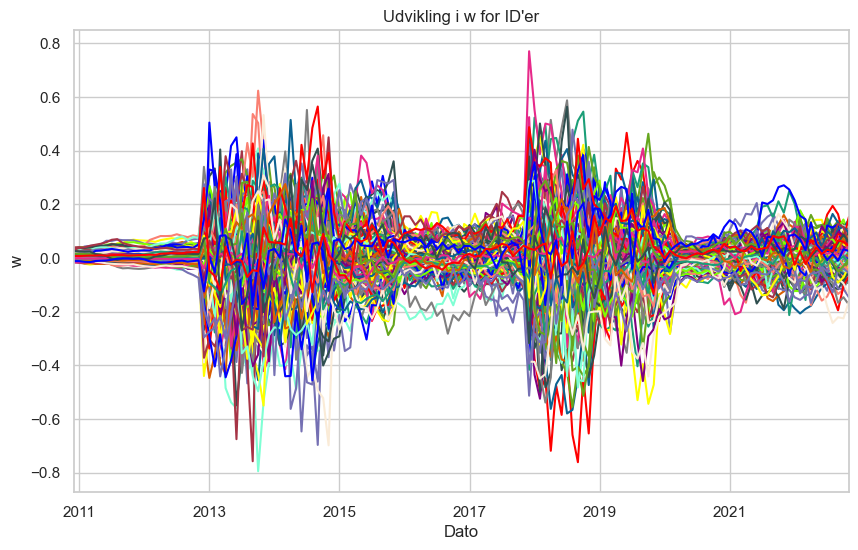

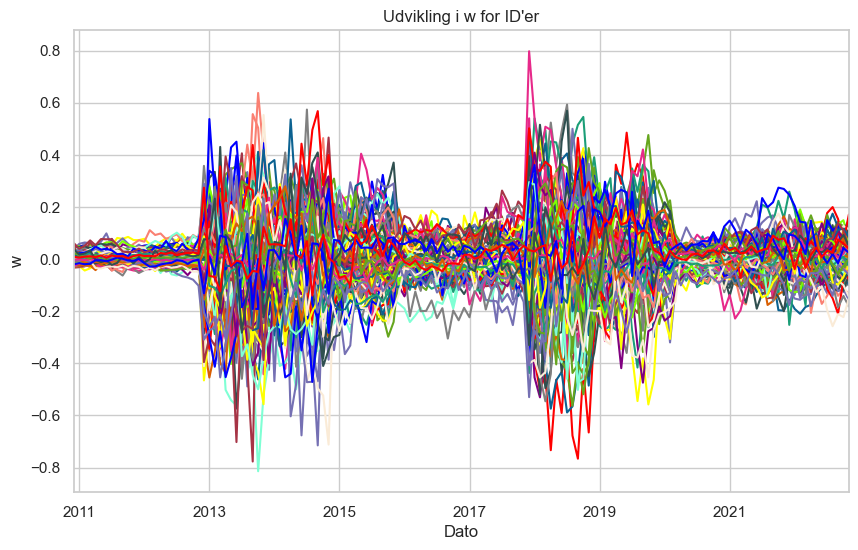

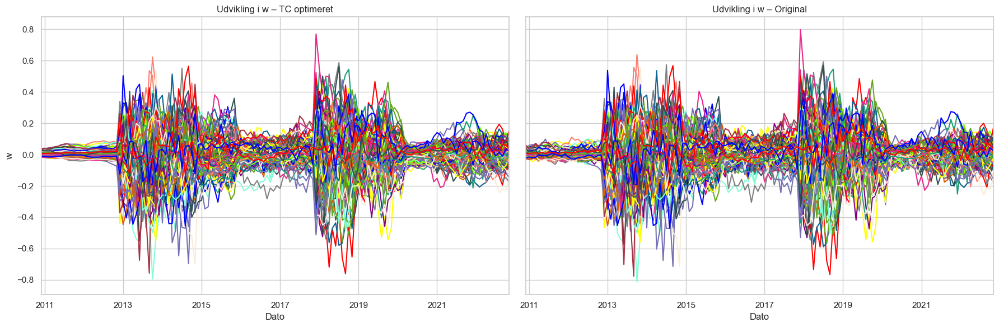

In [134]:
plot_specific_ids(tpf_trans_closed["w"], id_list=None, weight_col='w', show_legend=False)
plot_specific_ids(tpf_original["w"], id_list=None, weight_col='w', show_legend=False)

fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

# Plot tpf_trans (optimeret)
plot_specific_ids(tpf_trans_closed["w"], id_list=None, weight_col="w", ax=axes[0], show_legend=False)
axes[0].set_title("Udvikling i w – TC optimeret")
axes[0].set_xlabel("Dato")
axes[0].set_ylabel("w")

# Plot tpf_original
plot_specific_ids(tpf_original["w"], id_list=None, weight_col="w", ax=axes[1], show_legend=False)
axes[1].set_title("Udvikling i w – Original")
axes[1].set_xlabel("Dato")

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "w_udvikling_MVO_ML_TC_optimeret"), dpi=300, bbox_inches='tight')
plt.show()


## Illustration af bindende (aktiv) bibetingelse

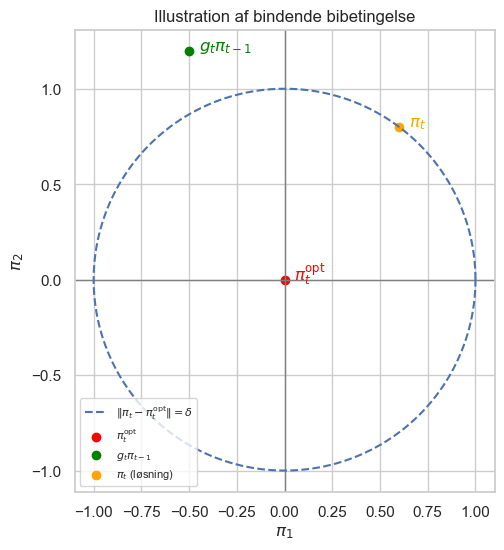

In [18]:
import numpy as np
import matplotlib.pyplot as plt

# Parameter for cirklens radius
delta = 1.0

# Opret et grid af vinkler til at tegne en cirkel
theta = np.linspace(0, 2*np.pi, 200)
circle_x = delta * np.cos(theta)
circle_y = delta * np.sin(theta)

# Antag, at den optimale portefølje (pi_opt) er i (0, 0)
pi_opt = np.array([0.0, 0.0])

# Placér cirklens centrum ved pi_opt
circle_center_x = pi_opt[0]
circle_center_y = pi_opt[1]

# Flyt cirklens koordinater til (pi_opt)
circle_x += circle_center_x
circle_y += circle_center_y

# Eksempel: Tidligere portefølje ganget med g_t
# (Her vælger vi bare et eksempelpunkt til illustration)
g_pi_prev = np.array([-0.5, 1.2])

# Eksempel: Den faktiske løsning på randen
# (Igen bare et eksempel)
pi_t = np.array([0.6, 0.8])

# Nu tegner vi det hele
plt.figure(figsize=(6,6))
plt.axhline(0, color='grey', linewidth=1)
plt.axvline(0, color='grey', linewidth=1)

# Tegn cirklen (afvigelsesgrænsen)
plt.plot(circle_x, circle_y, 'b--', label=r'$\|\pi_t - \pi_t^{\mathrm{opt}}\| = \delta$')

# Plot punkterne
plt.scatter(pi_opt[0], pi_opt[1], color='red', label=r'$\pi_t^{\mathrm{opt}}$')
plt.scatter(g_pi_prev[0], g_pi_prev[1], color='green', label=r'$g_t \pi_{t-1}$')
plt.scatter(pi_t[0], pi_t[1], color='orange', label=r'$\pi_t$ (løsning)')

# For overskuelighed kan vi annotere punkter
plt.text(pi_opt[0] + 0.05, pi_opt[1], r'$\pi_t^{\mathrm{opt}}$', color='red')
plt.text(g_pi_prev[0] + 0.05, g_pi_prev[1], r'$g_t \pi_{t-1}$', color='green')
plt.text(pi_t[0] + 0.05, pi_t[1], r'$\pi_t$', color='orange')

# Aksetilpasning og titel
plt.title('Illustration af bindende bibetingelse')
plt.xlabel(r'$\pi_1$')
plt.ylabel(r'$\pi_2$')
plt.gca().set_aspect('equal', adjustable='box')
#plt.legend()
plt.legend(
    loc='lower left',            # placér i nederste venstre hjørne
    bbox_to_anchor=(0.0, 0.0),   # finjustér selve boksen i forhold til hjørnet
    prop={'size': 8},            # gør fonten mindre
    frameon=True,                # evt. True/False for at vise/fjerne ramme
    #title='Min lille legend'     # du kan også give legend-boksen en titel
)
plt.grid(True)
plt.savefig(os.path.join(output_folder, "Bindende_bibetingelse.png"), dpi=300, bbox_inches='tight')
plt.show()
